# 0 프로젝트 소개 및 개요

## NLP를 활용한 소통 서비스 메시지 요약
**[ 프로젝트 목적 ]**
-	케이팝 팬덤을 대상으로 하는 **유료 소통 플랫폼 서비스**가 각광받고 있다.
-	그 중 두드러진 성장세를 보이고 있는 **1:1 채팅 서비스 플랫폼(버블, 유니버스 등)의 기능 확장**을 목적으로,
-	**팬들에게서 온 메시지를 요약**해서 아티스트에게 보여주는 기능을 기획하였다.

**[ 프로젝트 기획 배경 ]**
- **엔터사업에서 새로운 아이디어를 통해 수익을 창출**하고 있는 디어유 버블 서비스가 흥미롭고, 향후 이런 서비스를 개발해보고 싶은 마음에 프로젝트를 기획하게 되었다. 
- 버블 앱을 직접 사용해보면서 **사용자를 위한 추가적인 기능**이 무엇이 있을까 고민하다 **메시지 요약을 주제로** 선정했다.


## 프로젝트 가설 및 예상결과
**(가설)**
-	유료 소통 플랫폼 서비스 중 하나인 디어유 버블의 서비스 가입자는 100만명 이상이다.
-	따라서 **아티스트에게 오는 메시지 양은 짧은 시간 내에 읽을 수 없을 정도로 많을 것**이다.
-	아티스트는 다수의 팬들과 원활한 의사소통을 위해 메시지 요약 기능을 필요로 할 것이다.

**(예상결과)**
-	**요약 기능을 활용하면 보다 빠르고 편리하게 팬들의 니즈를 확인**할 수 있다.
-	또한 유료 소통의 경우 월별 정기 구독이므로 지속적으로 소통해야한다는 특징이 있는데,
-	활동기 등 바쁜 시기에도 요약 기능을 활용하여 유료 소통에 대한 부담감을 줄일 수 있다.

**(관련 기사)**
- 팬덤 플랫폼 키우는 엔터사들…합종연횡·글로벌화 박차(종합) https://www.yna.co.kr/view/AKR20210607049951005
- SM·JYP '버블' 키운다…위버스 대항마로 '점프업' https://news.mt.co.kr/mtview.php?no=2021060612235749452

## 프로젝트 분석방법
- KoNLPy를 활용한 토큰화
- CountVectorizer, TfidfVectorizer를 활용한 주요 토픽 추출
- TextRank, lexrankr을 활용한 주요 문장 요약 및 비교 분석


- 한글 폰트 설정

In [ ]:
# # 한글 깨짐 수정
# !sudo apt-get install -y fonts-nanum
# !sudo fc-cache -fv
# !rm ~/.cache/matplotlib -rf

In [1]:
# 폰트 설정
import matplotlib as mpl
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
%matplotlib inline
%config InlineBackend.figure_format='retina'

mpl.rc("font", family='NanumBarunGothic')
plt.rc("font", family='NanumBarunGothic')
# 마이너스 사인 수정
mpl.rc('axes', unicode_minus=False)

# 1 데이터 취득
팬들이 보내는 메시지를 취득할 방법을 고민해 본 결과,
-	(x) 1. 서비스 운영사에 데이터 요청: 유저 동의 없이 데이터 받기란 불가능할 것으로 예상
-	(x) 2. 임의로 데이터 생성하여 사용: 프로젝트 주제에 맞는 충분한 데이터 생성하기 어려움
-	(o) 3. 트위터API 활용: 해시태그를 통해 아티스트별 팬덤 메시지 취득
  -	유료 소통 서비스는 글자수, 답장 횟수 제한 등이 있어, 추가적인 메시지를 보내려 하는 팬들은 해당 아티스트의 특정 해시태그를 사용하여 트윗 작성한다는 특징을 반영했다.

- 따라서, Twitter Hash tag를 키워드로 사용하여 아티스트에게 보내는 팬들의 메시지를 수집할 수 있다.

In [ ]:
# pip install tweepy

In [ ]:
# import tweepy

# api_key = 'e9VJ2E66qqfQcGWRW1k9CbKGY'
# api_secret = 'qsbpDfNd0WPzL090qwKoFJcPFtWSsQiNQvvbZLrl1ujPUe7V0x'

# access_token = '1372382199748567042-5cY2FjeWLZ9d0EtAGqg7esBHE8E94W'
# access_secret = '3FT384NVPJCndU0WWqprUbMRUkug4cueQgKcAq7zeDn8B'

# auth = tweepy.OAuthHandler(api_key, api_secret)
# auth.set_access_token(access_token, access_secret)

# api = tweepy.API(auth, wait_on_rate_limit=True)

## 메인 데이터
- 같은 기간동안 수집되는 데이터는 실제 버블 서비스가 트위터 해시태그보다 훨씬 많을 것이다.
- 트위터 해시태그 검색 시에도 충분한 양의 데이터를 확보할 수 있도록 케이팝 팬 커뮤니티에서 '버블' 키워드로 검색하여 소통이 활발한 것으로 보이는 아이돌 그룹을 선정하였다.


- 트위터 API를 통해 데이터를 수집할 경우 당일로부터 최대 일주일간의 데이터를 확인할 수 있다.

### 1) 에스파 카리나 님

In [ ]:
# # 키워드: 아티스트가 검색을 원활히 할 수 있도록 동일한 해시태그를 달아두는 문화가 있으므로 이를 활용
# keyword = '#유지민은봐라' # 에스파 카리나 님 : 버블 서비스 사용빈도가 잦은 아티스트로 선정함
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_karina.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='ko', 
#                           #  since='2021-05-01',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()


In [ ]:
%load_ext google.colab.data_table

In [ ]:
import pandas as pd

column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_k = pd.read_csv('twit_data_karina.csv', names=column_headers)
df_k

,id,tweet_id,created_at,tweet
0,1,1401436058567413760,2021-06-06 07:09:28,#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙
1,2,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa
2,3,1401424032348606466,2021-06-06 06:21:41,머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 ...
3,4,1401422571321495557,2021-06-06 06:15:52,#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면...
4,5,1401415567718846468,2021-06-06 05:48:03,오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길...
...,...,...,...,...
1130,1980,1398619371384102920,2021-05-29 12:36:57,#유지민은봐라\n\n지민아 진짜 릴레이댄스 너어어무 최고야😭 나 진짜 지민이 나오는...
1131,1982,1398577502239424513,2021-05-29 09:50:35,#유지민은봐라\n\n지민아!!! 릴레이댄스 미쳐써?!!! 너무조하아아아아아ㅠㅠㅠㅠㅠ...
1132,1983,1398565863133908995,2021-05-29 09:04:20,#카리나버블 #유지민은봐라\n오늘 날이 좋아서 더 생각난다 지민아😚 볕이 살짝 비치...
1133,1984,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...


- 중복데이터 확인

In [ ]:
len(df_k.drop_duplicates())

1135

### 2) 에스파 윈터 님

In [ ]:
# keyword = '#겨울이버블' # 에스파 윈터 님
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_winter.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='ko', 
#                           #  since='2021-05-01',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()

In [ ]:
column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_w = pd.read_csv('twit_data_winter.csv', names=column_headers)
df_w

,id,tweet_id,created_at,tweet
0,5,1401443262095761408,2021-06-06 07:38:05,#겨울이버블 민정이 기타곡 갑자기 추천하고 싶어졌어... 내가 예전부터 민정이가 꼭...
1,7,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa
2,9,1401429932354412555,2021-06-06 06:45:07,이 영화를 추천합니다 \n태국 영화 😉👍🏻 #겨울이버블 https://t.co/x6...
3,12,1401425930413764609,2021-06-06 06:29:13,난 당신의 깊은 목소리 너무 사랑! 너무 매력적입니다. 하지만 난 당신의 목소리가 ...
4,13,1401422973576245251,2021-06-06 06:17:28,"난 정말 당신이 쇼에 너무 당신의 춤 실력을 보여 주었다 바랍니다. 아, 그런데. ..."
...,...,...,...,...
794,2206,1398572666450153472,2021-05-29 09:31:22,김민정 춤 너무 쫀득하게 찰지게 잘춰...너 왤케 잘하니? 노래도 완전 쫀득하게 부...
795,2207,1398554584084193289,2021-05-29 08:19:31,#겨울이버블 #윈터버블 민정이 좋아하는 비 오니까~ 노래 추천해줄게!! https:...
796,2208,1398547861466460163,2021-05-29 07:52:48,내 튀긴 계란는 어때 민정아?? \n#겨울이버블 #윈터버블 https://t.co/...
797,2209,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...


- 중복데이터 확인

In [ ]:
len(df_w.drop_duplicates())

799

- 6월 7일 하루동안의 데이터만 살펴보자

In [ ]:
# keyword = '#겨울이버블' # 에스파 윈터 님
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_winter_67.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='ko', 
#                           since='2021-06-07',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()

In [ ]:
column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_w_67 = pd.read_csv('twit_data_winter_67.csv', names=column_headers)
df_w_67

,id,tweet_id,created_at,tweet
0,9,1401968157175128070,2021-06-07 18:23:50,#겨울이버블 아이예쁘다아이예뿌다 쓰담쓰담 토닥토닥 궁디팡ㅇㅇㅇㄴㅇㄴ
1,12,1401966313166151681,2021-06-07 18:16:30,#겨울이버블 민정이 잘자기 좋은 꿈 꾸기❤️
2,15,1401964699994845186,2021-06-07 18:10:06,#겨울이버블\n항상 노력해줘서 고마워 사랑해사랑해사랑해❤❤❤❤
3,16,1401964683037351936,2021-06-07 18:10:02,메이크업 없으면 너가 예뻐 #겨울이버블
4,18,1401964167062380544,2021-06-07 18:07:59,왜 아직 안자????? #겨울이버블
...,...,...,...,...
842,1226,1401713363185389568,2021-06-07 01:31:23,김민정 운동 갔습니까? #겨울이버블 #윈터버블
843,1227,1401709332706725892,2021-06-07 01:15:22,#겨울이버블\n김오또케 일어나라
844,1228,1401705678947819524,2021-06-07 01:00:50,#겨울이버블 삼십분뒤에운동가셔야합니다공주님
845,1230,1401692745970839554,2021-06-07 00:09:27,쩡아 오늘도 기분좋은 하루보내\n넌 나의 첫번째니까💛💛 \n#겨울이버블 https:...


- 중복데이터 확인

In [ ]:
len(df_w_67.drop_duplicates())

847

## (참고) 영어 데이터 비율 확인
- 버블 해외 이용자의 비율이 68%라고 하여 동일한 해시태그의 영어 트윗을 살펴보았으나 개수가 300개 가량으로 많지 않다. (한글 트윗 대비 20~30% 수준)
- 언어 사용 비율에 있어 전체 사용자와 개별 그룹간에 차이가 있을 것으로 보인다.
- 실제 해외 버블 이용자들은 영어 이외의 언어도 많이 사용하고 있을 것이나, 다양한 언어를 모두 분석하기에는 어려움이 있고 불용어 처리 등이 원활하지 않으므로
- 이번 분석에서는 언어를 한국어로 지정하여 추출한 데이터를 사용하였다.

In [ ]:
# keyword = '#유지민은봐라'
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_karina_en.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='en', 
#                           #  since='2021-05-01',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()


In [ ]:
# %load_ext google.colab.data_table

In [ ]:
import pandas as pd

column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_k_en = pd.read_csv('twit_data_karina_en.csv', names=column_headers)
df_k_en

,id,tweet_id,created_at,tweet
0,3,1401419264498626560,2021-06-06 06:02:44,When Karina started singing in Forever I thoug...
1,4,1401411667896930310,2021-06-06 05:32:33,KARISELLE IN MONOCHROME \n#지구젤리버블\n#유지민은봐라 htt...
2,5,1401381413333524484,2021-06-06 03:32:20,I hope y'all seeing all the praises 🥺 #유지민은봐라...
3,6,1401362907842052096,2021-06-06 02:18:47,Now I know why Karina is so proud over Winter’...
4,7,1401345331439181833,2021-06-06 01:08:57,WAKE UP HUN! You just got noticed!!!\n#유지민은봐라 ...
...,...,...,...,...
319,434,1398612148750675969,2021-05-29 12:08:15,"KNOWING BROTHERS NOW! Can’t wait to see you, #..."
320,435,1398604987098275840,2021-05-29 11:39:48,"Jiminie, what's your haircare routine. Pls tel..."
321,436,1398602500425412617,2021-05-29 11:29:55,"as much as i want a blonde jimin, i wouldnt ri..."
322,437,1398589981740785667,2021-05-29 10:40:10,I blame the heat to you 😸🔥\n\n#유지민은봐라\n\nhttps...


In [ ]:
# keyword = '#겨울이버블'
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_winter_en.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='en', 
#                           #  since='2021-05-01',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()

In [ ]:
column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_w_en = pd.read_csv('twit_data_winter_en.csv', names=column_headers)
df_w_en

,id,tweet_id,created_at,tweet
0,4,1401418606009753606,2021-06-06 06:00:07,I’m just going to say again that Winter makes ...
1,5,1401404337952198656,2021-06-06 05:03:25,#겨울이버블 Look at this winter~ So nice rignt? htt...
2,7,1401390890468315138,2021-06-06 04:09:59,Minjeong ah.. Please eatwell 😢 we love you \n\...
3,8,1401389794261864451,2021-06-06 04:05:38,#겨울이버블 Hi puppy i love you so much https://t.c...
4,9,1401388418739761153,2021-06-06 04:00:10,good morning^^ #겨울이버블 #윈터버블
...,...,...,...,...
342,854,1398688741238050821,2021-05-29 17:12:36,i can listen to u all dayy 🥺 #겨울이버블
343,856,1398670599472390158,2021-05-29 16:00:31,"WHERE ARE MY BABIES 🥺\nI MISSING YOU, WAITING ..."
344,857,1398667396030758912,2021-05-29 15:47:47,Good night my girls! Take a good rest for tomo...
345,858,1398613073372475397,2021-05-29 12:11:56,Are you watching? Please make some noise. 🤣\n#...


## (참고) 타그룹 데이터
- 버블 서비스 이용 중인 타그룹 데이터도 간단히 살펴보았다.
- NCT 정우 님의 해시태그인 '#정우버블'로 검색하였으며, 검색량이 많지는 않아 분석에 사용하지 않았다.
- 현재 활동기가 아니기 때문에 팬덤 규모에 비해 다소 적은 양의 트윗 데이터가 검색된 것으로 보인다.

In [ ]:
# keyword = '#정우버블'
# result = []

In [ ]:
# import csv
# csvFile = open('twit_data_jwoo.csv', 'a')
# #Use csv Writer
# csvWriter = csv.writer(csvFile)

In [ ]:
# raw_tweets = tweepy.Cursor(api.search, q=keyword, lang='ko', 
#                           #  since='2021-05-01',
#                           #  until='2021-05-31',    #  the search index has a 7-day limit
#                            count=10000,
#                            tweet_mode='extended'
#                            )
# for i,tweet in enumerate(raw_tweets.items()):
#   if 'RT @' not in tweet.full_text:
#     csvWriter.writerow([i,tweet.id, tweet.created_at, tweet.full_text])
# csvFile.close()

In [ ]:
column_headers = ['id', 'tweet_id', 'created_at', 'tweet']
df_jw = pd.read_csv('twit_data_jwoo.csv', names=column_headers)
df_jw

,id,tweet_id,created_at,tweet
0,11,1401453380300464129,2021-06-06 08:18:18,#정우버블 #정블리 \n내 티키타카도 봐주세 https://t.co/fY3dN6W6Zx
1,36,1401447051934658564,2021-06-06 07:53:09,장애인 인권을 지켜주세요. 제 메인 트윗과 제 트윗들을 봐주시면 감사하겠습니다. 실...
2,56,1401439320230096901,2021-06-06 07:22:26,엔시티 포카 양도\n준미포\n\n반택 0.16\n준등기 0.18\n\nnct dre...
3,72,1401436008713920518,2021-06-06 07:09:16,엔시티 드림 웨이션브이 슈퍼엠 백현 카이 태민 첸 \n개봉 앨범 양도\n포카❌ \n...
4,86,1401433447353098240,2021-06-06 06:59:05,#정우버블 #정블리 \n\n오억만년만의 티키타카 공유합니다... https://t....
...,...,...,...,...
658,1078,1398964658195685379,2021-05-30 11:29:00,정우야.. 오늘 착장으로 거울셀카 한번만....\n#정우버블 #정블리
659,1079,1398794300754829313,2021-05-30 00:12:04,#정우버블 #정블리 Cristiano가 ManU로 돌아오도록 함께 기도합시다. 그러...
660,1081,1398683186817757186,2021-05-29 16:50:32,빠라가 무슨말인데....왜 금칙어인데...? #정우버블 https://t.co/mn...
661,1082,1398656885406924800,2021-05-29 15:06:01,모든 것이 언젠가 끝날 것이라는 것을 모른다는 듯이\n불길하고 아름다운 시간이 끝나...


# 2 EDA(Exploratory Data Analysis, 탐색적 데이터 분석)
- 자연어처리에 앞서, 간단히 EDA를 수행해보았다.
- 일주일 간의 트윗 해시태그 검색결과에 대해 날짜별 분포와 트윗별 단어 갯수 분포를 살펴보자.

## 1) 날짜별 트윗 갯수 분포

In [ ]:
df_k_eda = df_k.copy()

In [ ]:
df_k_eda['dates'] = df_k_eda['created_at'].str.split(' ').str[0]

In [ ]:
df_k_plot = df_k_eda.groupby(by='dates').count()[['tweet']]
df_k_plot

,tweet
dates,
2021-05-29,33
2021-05-30,234
2021-05-31,39
2021-06-01,72
2021-06-02,90
2021-06-03,349
2021-06-04,192
2021-06-05,117
2021-06-06,9


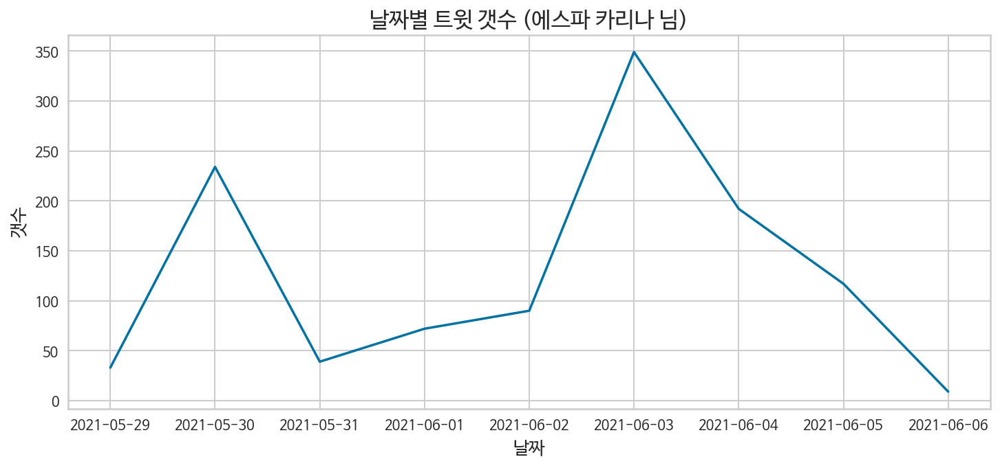

In [ ]:
plt.figure(figsize=(12,5))
plt.plot(df_k_plot)
plt.title('날짜별 트윗 갯수 (에스파 카리나 님)', fontdict={'size':16})
plt.xlabel('날짜', fontdict={'size':13})
plt.ylabel('갯수', fontdict={'size':13});

- 아티스트의 소통 횟수와 팬들이 보내는 트윗 갯수 간에 어떤 관계가 있는지 살펴보기 위해,
- 일주일간 에스파 카리나님이 보낸 버블 메시지 개수를 확인 해 보았다.

In [ ]:
'''
날짜 : 메시지수 - 대화 주제
5/29 : 0
5/30 : 12 - 음악방송 다녀옴, 셀카
5/31 : 5 - 천둥번개 무서워
6/1 : 2 - 인사
6/2 : 8 - 식사
6/3 : 6 - 식사, 멤버들 이야기
6/4 : 26 - 취미생활, 셀카, 드라마 스포금지
6/5 : 37 - 멤버들과 장난, 셀카
6/6 : 7 - 인사
'''

- 트윗 데이터의 서버 시각이 우리나라보다 9시간 정도 느리게 설정되어있어서 트윗 기준으로 날짜별 버블 메시지를 다시 정리해보면,

In [ ]:
'''
날짜 : 메시지수 - 대화 주제
5/29 : 4 - 음악방송 다녀옴
5/30 : 10 - 리허설, 셀카 3장, 천둥번개 무서워
5/31 : 0
6/1 : 2 - 인사
6/2 : 8 - 식사
6/3 : 30 - 식사, 멤버들 이야기, 취미생활, 셀카
6/4 : 30 - 드라마 스포금지, 멤버들과 장난
6/5 : 13 - 셀카, 인사
6/6 : 0
'''

In [2]:
import pandas as pd

In [10]:
bubble = {"messages":[4,10,0,2,8,30,30,13,0],
          "topic" : ['음악방송','리허설, 셀카, 천둥번개',''
          ,'인사','식사','식사, 멤버들, 취미생활, 셀카','드라마, 장난','셀카, 인사','']}
df_m = pd.DataFrame(bubble,  index=['2021-05-29','2021-05-30','2021-05-31',
                                    '2021-06-01','2021-06-02','2021-06-03',
                                    '2021-06-04','2021-06-05','2021-06-06'])

In [11]:
df_m

,messages,topic
2021-05-29,4,음악방송
2021-05-30,10,"리허설, 셀카, 천둥번개"
2021-05-31,0,
2021-06-01,2,인사
2021-06-02,8,식사
2021-06-03,30,"식사, 멤버들, 취미생활, 셀카"
2021-06-04,30,"드라마, 장난"
2021-06-05,13,"셀카, 인사"
2021-06-06,0,


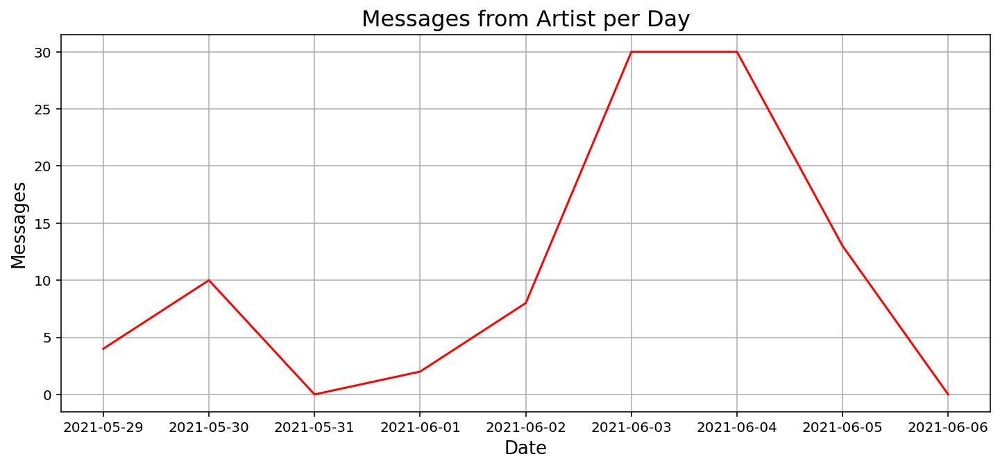

In [14]:
plt.figure(figsize=(12,5))
plt.plot(df_m['messages'], color = 'r')
plt.grid(True)
plt.title('Messages from Artist per Day', fontdict={'size':16})
plt.xlabel('Date', fontdict={'size':13})
plt.ylabel('Messages', fontdict={'size':13});

- 아티스트가 보낸 메시지 수와 팬들이 보낸 트윗 수의 추이가 비슷한 것을 확인할 수 있다.

In [ ]:
df_w_eda = df_w.copy()

In [ ]:
df_w_eda['dates'] = df_w_eda['created_at'].str.split(' ').str[0]

In [ ]:
df_w_plot = df_w_eda.groupby(by='dates').count()[['tweet']]
df_w_plot

,tweet
dates,
2021-05-29,18
2021-05-30,54
2021-05-31,50
2021-06-01,78
2021-06-02,149
2021-06-03,103
2021-06-04,146
2021-06-05,174
2021-06-06,27


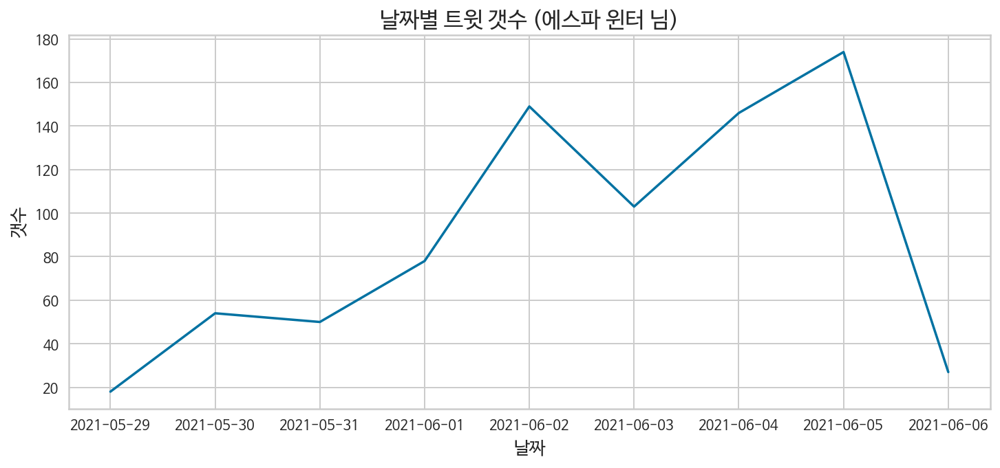

In [ ]:
plt.figure(figsize=(12,5))
plt.plot(df_w_plot)
plt.title('날짜별 트윗 갯수 (에스파 윈터 님)', fontdict={'size':16})
plt.xlabel('날짜', fontdict={'size':13})
plt.ylabel('갯수', fontdict={'size':13});

- 트윗 갯수가 많은 날에는 아티스트와 팬 간의 소통이 더욱 활발했음을 유추할 수 있으며,
- 같은 그룹 멤버간에도 날짜별 소통횟수는 연관관계가 나타나지 않는 것으로 보인다.

## 2) 트윗별 단어 갯수 분포

In [ ]:
import numpy as np

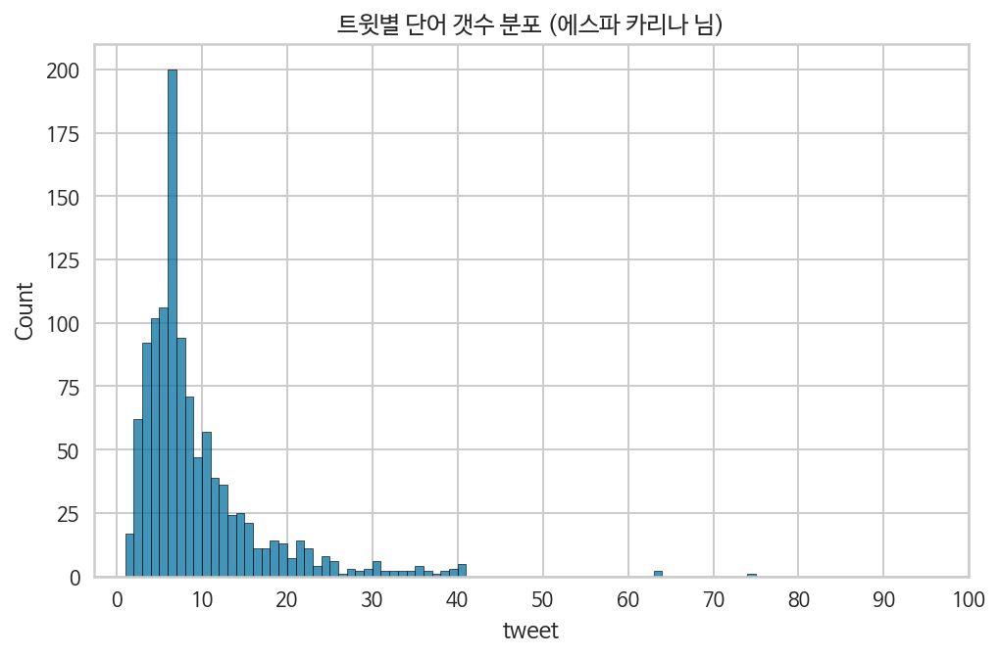

In [ ]:
original_word_counts = df_k_eda['tweet'].apply(lambda x:len(x.split(' ')))

plt.figure(figsize=(8,5))
sns.histplot(original_word_counts, binwidth=1)
plt.title('트윗별 단어 갯수 분포 (에스파 카리나 님)')
plt.xticks(np.arange(0,110,10));

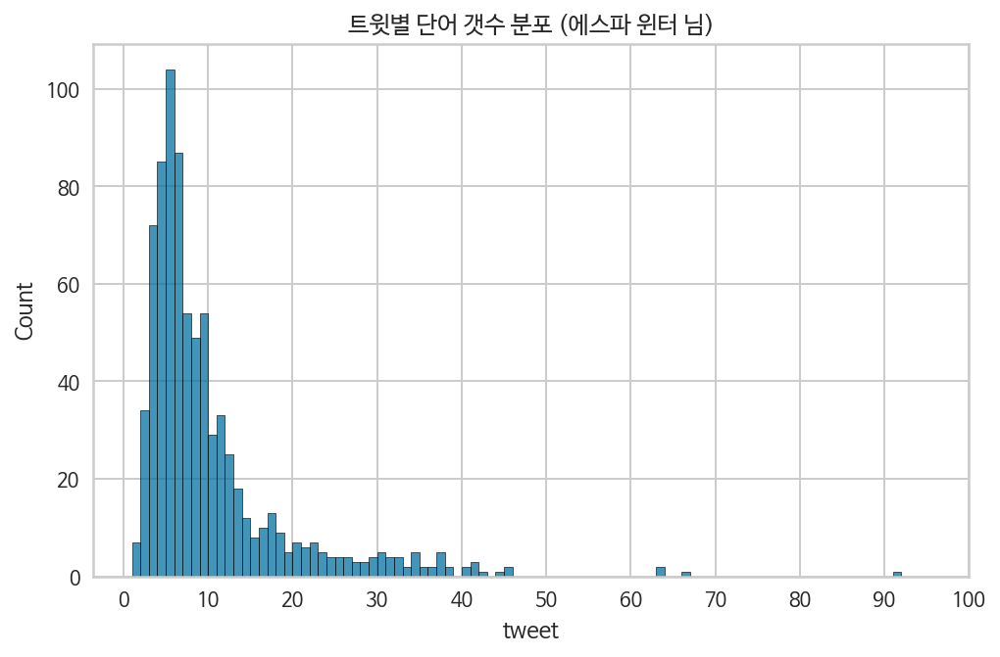

In [ ]:
original_word_counts = df_w_eda['tweet'].apply(lambda x:len(x.split(' ')))

plt.figure(figsize=(8,5))
sns.histplot(original_word_counts, binwidth=1)
plt.title('트윗별 단어 갯수 분포 (에스파 윈터 님)')
plt.xticks(np.arange(0,110,10));

- 트윗별 단어 갯수 분포는 평균적으로 5~6개 정도이다.

# 3 전처리
- 토큰화(형태소 분석)
- 불용어 처리

## SKT의 KoBART 사용
- 토큰화
- SKT에서 공개한 세번째 AI 언어처리 모델인 KoBART는 한국어 뉴스나 문서를 읽고 고품질 요약문을 만들어내는 능력이 뛰어난 것으로 알려져 있다.
- KoBART를 이용해 먼저 토큰화를 진행해보았다.
- https://github.com/SKT-AI/KoBART

In [ ]:
pip install git+https://github.com/SKT-AI/KoBART#egg=kobart

In [ ]:
from kobart import get_kobart_tokenizer
kobart_tokenizer = get_kobart_tokenizer()
df_k['tokens'] = df_k['tweet'].apply(kobart_tokenizer.tokenize)

using cached model


In [ ]:
df_k

,id,tweet_id,created_at,tweet,tokens
0,1,1401436058567413760,2021-06-06 07:09:28,#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙,"[▁#, 유지, 민은, 봐, 라, ▁애, 기야, ▁쉬, 는, 날, 에, ▁모, 하니..."
1,2,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa,"[▁#, 유지, 민은, 봐, 라, ▁#, 겨울, 이버, 블, \n, 즐, 주, 보,..."
2,3,1401424032348606466,2021-06-06 06:21:41,머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 ...,"[▁머, 글, 친구, 들이, 랑, ▁호, 캉, 스, 중, 인데, ▁포, 카, ▁하나..."
3,4,1401422571321495557,2021-06-06 06:15:52,#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면...,"[▁#, 유지, 민은, 봐, 라, ▁밤에, ▁보낸, 걸, ▁이제, ▁쓰는, ▁나, ..."
4,5,1401415567718846468,2021-06-06 05:48:03,오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길...,"[▁오늘, ▁날씨, ▁지, 민이, ▁같아, ~, ▁너무, ▁좋고, ▁예쁘, 다는, ..."
...,...,...,...,...,...
1130,1980,1398619371384102920,2021-05-29 12:36:57,#유지민은봐라\n\n지민아 진짜 릴레이댄스 너어어무 최고야😭 나 진짜 지민이 나오는...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, ▁진짜, ▁릴, 레이,..."
1131,1982,1398577502239424513,2021-05-29 09:50:35,#유지민은봐라\n\n지민아!!! 릴레이댄스 미쳐써?!!! 너무조하아아아아아ㅠㅠㅠㅠㅠ...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, !!, !, ▁릴, 레..."
1132,1983,1398565863133908995,2021-05-29 09:04:20,#카리나버블 #유지민은봐라\n오늘 날이 좋아서 더 생각난다 지민아😚 볕이 살짝 비치...,"[▁#, 카, 리나, 버, 블, ▁#, 유지, 민은, 봐, 라\n, 오늘, ▁날이,..."
1133,1984,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...,"[▁#, 겨울, 이버, 블, ▁#, 유지, 민은, 봐, 라\n, 맛, 저, ▁~, ..."


- 불필요하게 많은 부분이 토큰화되어 의미가 있는 단어들마저도 쪼개진 것을 볼 수 있다.

## KoNLPy 활용
- KoNLPy를 활용하여 토큰화를 진행해보았다.
- KoNLPy의 여러 클래스 중 속도가 빠른 편이고 윈도우 환경에서도 원활하게 작동하는 Okt(구 Twitter)를 사용하였다.
- 박은정, 조성준, “KoNLPy: 쉽고 간결한 한국어 정보처리 파이썬 패키지”, 제 26회 한글 및 한국어 정보처리 학술대회 논문집, 2014.

In [ ]:
pip install konlpy

In [ ]:
from konlpy.tag import Okt
okt = Okt()
df_k['tokens_okt'] = df_k['tweet'].apply(okt.morphs)
df_k

,id,tweet_id,created_at,tweet,tokens,tokens_okt
0,1,1401436058567413760,2021-06-06 07:09:28,#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙,"[▁#, 유지, 민은, 봐, 라, ▁애, 기야, ▁쉬, 는, 날, 에, ▁모, 하니...","[#유지민은봐라, 애기야, 쉬는, 날, 에, 모하, 니, ??, 민정, 이랑, 한,..."
1,2,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa,"[▁#, 유지, 민은, 봐, 라, ▁#, 겨울, 이버, 블, \n, 즐, 주, 보,...","[#유지민은봐라, #겨울이버블, \n, 즐, 주보, 내, 🥲🤍🤍, https://t..."
2,3,1401424032348606466,2021-06-06 06:21:41,머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 ...,"[▁머, 글, 친구, 들이, 랑, ▁호, 캉, 스, 중, 인데, ▁포, 카, ▁하나...","[머글, 친구, 들, 이랑, 호캉스중, 인데, 포카, 하나, 씩, 강제, 로, 쥐어..."
3,4,1401422571321495557,2021-06-06 06:15:52,#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면...,"[▁#, 유지, 민은, 봐, 라, ▁밤에, ▁보낸, 걸, ▁이제, ▁쓰는, ▁나, ...","[#유지민은봐라, 밤, 에, 보낸, 걸, 이제, 쓰는, 나, ..., 잠오는데, 잠..."
4,5,1401415567718846468,2021-06-06 05:48:03,오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길...,"[▁오늘, ▁날씨, ▁지, 민이, ▁같아, ~, ▁너무, ▁좋고, ▁예쁘, 다는, ...","[오늘, 날씨, 지민, 이, 같아, ~, 너무, 좋고, 예쁘다는, 뜻, !!, 나른..."
...,...,...,...,...,...,...
1130,1980,1398619371384102920,2021-05-29 12:36:57,#유지민은봐라\n\n지민아 진짜 릴레이댄스 너어어무 최고야😭 나 진짜 지민이 나오는...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, ▁진짜, ▁릴, 레이,...","[#유지민은봐라, \n\n, 지민, 아, 진짜, 릴레이, 댄스, 너, 어어, 무, ..."
1131,1982,1398577502239424513,2021-05-29 09:50:35,#유지민은봐라\n\n지민아!!! 릴레이댄스 미쳐써?!!! 너무조하아아아아아ㅠㅠㅠㅠㅠ...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, !!, !, ▁릴, 레...","[#유지민은봐라, \n\n, 지민, 아, !!!, 릴레이, 댄스, 미쳐, 써, ?!..."
1132,1983,1398565863133908995,2021-05-29 09:04:20,#카리나버블 #유지민은봐라\n오늘 날이 좋아서 더 생각난다 지민아😚 볕이 살짝 비치...,"[▁#, 카, 리나, 버, 블, ▁#, 유지, 민은, 봐, 라\n, 오늘, ▁날이,...","[#카리나버블, #유지민은봐라, \n, 오늘, 날, 이, 좋아서, 더, 생각난다, ..."
1133,1984,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...,"[▁#, 겨울, 이버, 블, ▁#, 유지, 민은, 봐, 라\n, 맛, 저, ▁~, ...","[#겨울이버블, #유지민은봐라, \n, 맛저, ~!, 지민, 정아, 🐱🐶💙💚, ht..."


- 토큰화가 잘 된 것을 볼 수 있다.

- 불용어처리 : 한글 불용어는 검색을 통해 일부를 적용하고, 토큰화한 결과를 보면서 추가/제거 해 주었다.

In [ ]:
stop_words = '''#유지민은봐라 유지민은봐라 #리나버블 #카리나버블 지민 카리나 버블 #겨울이버블 하니까 같아 뭔 요 
              거 은 이지 도 였던 유지민 했습니다 이고 난 해 했을 했습니다 웅 흠 음 햇 도착 는 고 게
              여서 이 닝깅이에게 겨울이버블 지구젤리버블 카리나버블 지젤버블 윈터버블 민정아
              정우도 정우버블 정블리
              아 휴 아이구 아이쿠 아이고 어 나 우리 저희 따라 의해 을 를 에 의 가 으로 로 에게 뿐이다 
              의거하여 근거하여 입각하여 기준으로 예하면 예를 들면 예를 들자면 저 소인 소생 저희 지말고 
              물론 또한 그리고 비길수 없다 해서는 안된다 뿐만 아니라 만이 아니다 만은 
              아니다 막론하고 관계없이 그치지 않다 그러나 그런데 하지만 든간에 논하지 않다 따지지 않다 설사 
              비록 더라도 아니면 만 못하다 하는 편이 낫다 불문하고 향하여 향해서 향하다 쪽으로 틈타 이용하여 
              타다 오르다 제외하고 이 외에 이 밖에 하여야 비로소 한다면 몰라도 외에도 이곳 여기 부터 기점으로 
              따라서 할 생각이다 하려고하다 이리하여 그리하여 그렇게 함으로써 하지만 일때 할때 앞에서 중에서 
              보는데서 으로써 로써 까지 해야한다 일것이다 반드시 할줄알다 할수있다 할수있어 임에 틀림없다 한다면 
              등 등등 제 겨우 단지 다만 할뿐 딩동 댕그 대해서 대하여 대하면 훨씬 얼마나 얼마만큼 얼마큼 남짓 
              여 얼마간 약간 다소 좀 조금 다수 몇 얼마 지만 하물며 또한 그러나 그렇지만 하지만 이외에도 대해 
              말하자면 뿐이다 말하자면 이와 바꾸어서 말하면 바꾸어서 한다면 만약 
              그렇지않으면 까악 툭 딱 삐걱거리다 보드득 비걱거리다 꽈당 응당 해야한다 에 가서 각 각각 여러분 
              각종 각자 제각기 하도록하다 와 과 그러므로 그래서 고로 한 까닭에 하기 때문에 거니와 이지만 대하여 
              관하여 관한 과연 실로 아니나다를가 생각한대로 진짜로 한적이있다 하곤하였다 하 하하 허허 아하 거바 
              와 오 왜 어째서 무엇때문에 어찌 하겠는가 무슨 어디 어느곳 더군다나 하물며 더욱이는 어느때 언제 야 
              이봐 어이 여보시오 흐흐 흥 휴 영차 여차 어기여차 끙끙 아야 앗 아야 콸콸 졸졸 좍좍 뚝뚝 
              주룩주룩 솨 우르르 그래도 또 그리고 바꾸어말하면 바꾸어말하자면 혹은 혹시 답다 및 그에 따르는 때가 
              되어 즉 지든지 설령 가령 하더라도 할지라도 일지라도 지든지 몇 거의 하마터면 인젠 이젠 된바에야 된이상 
              만큼 어찌됏든 그위에 게다가 점에서 보아 비추어 보아 고려하면 하게될것이다 일것이다 비교적 좀 보다더 
              비하면 시키다 하게하다 할만하다 의해서 연이서 이어서 잇따라 뒤따라 뒤이어 결국 의지하여 기대여 통하여 
              자마자 더욱더 불구하고 얼마든지 마음대로 주저하지 않고 곧 즉시 바로 당장 하자마자 밖에 안된다 하면된다 
              그래 그렇지 요컨대 다시 말하자면 바꿔 말하면 즉 구체적으로 말하자면 시작하여 시초에 이상 허 헉 허걱 
              바와같이 해도좋다 해도된다 게다가 더구나 하물며 와르르 팍 퍽 펄렁 동안 이래 하고있었다 이었다 에서 
              로부터 까지 예하면 했어요 해요 함께 같이 더불어 마저 마저도 양자 모두 습니다 가까스로 하려고하다 
              즈음하여 다른 다른 방면으로 해봐요 습니까 했어요 말할것도 없고 무릎쓰고 개의치않고 하는것만 못하다 
              하는것이 낫다 매 매번 들 모 어느것 어느 로써 갖고말하자면 어디 어느쪽 어느것 어느해 어느 년도 라 
              해도 언젠가 어떤것 어느것 저기 저쪽 저것 그때 그럼 그러면 요만한걸 그래 그때 저것만큼 그저 이르기까지 
              할 줄 안다 할 힘이 있다 너 너희 당신 어찌 설마 차라리 할지언정 할지라도 할망정 할지언정 구토하다 
              게우다 토하다 메쓰겁다 옆사람 퉤 쳇 의거하여 근거하여 의해 따라 힘입어 그 다음 버금 두번째로 기타 
              첫번째로 나머지는 그중에서 견지에서 형식으로 쓰여 입장에서 위해서 단지 의해되다 하도록시키다 
              뿐만아니라 반대로 전후 전자 앞의것 잠시 잠깐 하면서 그렇지만 다음에 그러한즉 그런즉 남들 아무거나 
              어찌하든지 같다 비슷하다 예컨대 이럴정도로 어떻게 만약 만일 위에서 서술한바와같이 인 듯하다 하지 
              않는다면 만약에 무엇 무슨 어느 어떤 아래윗 조차 한데 그럼에도 불구하고 여전히 심지어 까지도 조차도 
              하지 않도록 않기 위하여 때 시각 무렵 시간 동안 어때 어떠한 하여금 네 예 우선 누구 누가 알겠는가 아무도 
              줄은모른다 줄은 몰랏다 하는 김에 겸사겸사 하는바 그런 까닭에 한 이유는 그러니 그러니까 때문에 그 너희 
              그들 너희들 타인 것 것들 너 위하여 하기 위하여 어찌하여 무엇때문에 붕붕 윙윙 나 우리 
              엉엉 휘익 윙윙 오호 아하 어쨋든 만 못하다 하기보다는 차라리 하는 편이 낫다 흐흐 놀라다 상대적으로 
              말하자면 마치 아니라면 쉿 그렇지 않으면 그렇지 않다면 안 그러면 아니었다면 하든지 아니면 이라면 좋아 
              알았어 하는것도 그만이다 어쩔수 없다 하나 일 일반적으로 일단 한켠으로는 오자마자 이렇게되면 이와같다면 
              전부 한마디 한항목 근거로 하기에 아울러 하지 않도록 않기 위해서 이르기까지 이 되다 로 인하여 까닭으로 
              이유만으로 이로 인하여 그래서 이 때문에 그러므로 그런 까닭에 알 수 있다 결론을 낼 수 있다 으로 인하여 
              있다 어떤것 관계가 있다 관련이 있다 연관되다 어떤것들 에 대해 이리하여 그리하여 여부 하기보다는 하느니 
              하면 할수록 운운 이러이러하다 하구나 하도다 다시말하면 다음으로 에 있다 에 달려 있다 우리 우리들 오히려
              하기는한데 어떻게 어떻해 어찌됏어 어때 어째서 본대로 자 이 이쪽 여기 이것 이번 이렇게말하자면 이런 이러한 
              이와 같은 요만큼 요만한 것 얼마 안 되는 것 이만큼 이 정도의 이렇게 많은 것 이와 같다 이때 이렇구나 것과 
              같이 끼익 삐걱 따위 와 같은 사람들 부류의 사람들 왜냐하면 중의하나 오직 오로지 에 한하다 하기만 하면 
              도착하다 까지 미치다 도달하다 정도에 이르다 할 지경이다 결과에 이르다 관해서는 여러분 하고 있다 한 후 
              혼자 자기 자기집 자신 우에 종합한것과같이 총적으로 보면 총적으로 말하면 총적으로 대로 하다 으로서 참 
              그만이다 할 따름이다 쿵 탕탕 쾅쾅 둥둥 봐 봐라 아이야 아니 와아 응 아이 참나 년 월 일 령 영 일 이 삼 
              사 오 육 륙 칠 팔 구 이천육 이천칠 이천팔 이천구 하나 둘 셋 넷 다섯 여섯 일곱 여덟 아홉 령 영 이 있 하 
              것 들 그 되 수 이 보 않 없 나 사람 주 아니 등 같 우리 때 년 가 한 지 대하 오 말 일 그렇 위하 때문 그것 
              두 말하 알 그러나 받 못하 일 그런 또 문제 더 사회 많 그리고 좋 크 따르 중 나오 가지 씨 시키 만들 
              생각하 그러 속 하나 살 모르 적 월 데 자신 안 어떤 내 내 경우 명 생각 시간 다시 이런 앞 보이 
              번 나 다른 어떻 개 전 들 사실 이렇 점 싶 말 정도 좀 원 잘 통하 놓 게
              '''
stop_words=stop_words.split(' ')

In [ ]:
def stops(text):
  result = []
  for w in text:
    if w not in stop_words:
      result.append(w)
  return result



In [ ]:
df_k['except_stop_words'] = df_k['tokens_okt'].apply(stops)

In [ ]:
df_k

,id,tweet_id,created_at,tweet,tokens,tokens_okt,except_stop_words
0,1,1401436058567413760,2021-06-06 07:09:28,#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙,"[▁#, 유지, 민은, 봐, 라, ▁애, 기야, ▁쉬, 는, 날, 에, ▁모, 하니...","[#유지민은봐라, 애기야, 쉬는, 날, 에, 모하, 니, ??, 민정, 이랑, 한,...","[애기야, 쉬는, 날, 모하, 니, ??, 민정, 이랑, 강거, 니, 오늘, ......"
1,2,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa,"[▁#, 유지, 민은, 봐, 라, ▁#, 겨울, 이버, 블, \n, 즐, 주, 보,...","[#유지민은봐라, #겨울이버블, \n, 즐, 주보, 내, 🥲🤍🤍, https://t...","[즐, 주보, 🥲🤍🤍, https://t.co/z6uTJW0epa]"
2,3,1401424032348606466,2021-06-06 06:21:41,머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 ...,"[▁머, 글, 친구, 들이, 랑, ▁호, 캉, 스, 중, 인데, ▁포, 카, ▁하나...","[머글, 친구, 들, 이랑, 호캉스중, 인데, 포카, 하나, 씩, 강제, 로, 쥐어...","[머글, 친구, 이랑, 호캉스중, 인데, 포카, 씩, 강제, 쥐어주고, 사진, 찍음..."
3,4,1401422571321495557,2021-06-06 06:15:52,#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면...,"[▁#, 유지, 민은, 봐, 라, ▁밤에, ▁보낸, 걸, ▁이제, ▁쓰는, ▁나, ...","[#유지민은봐라, 밤, 에, 보낸, 걸, 이제, 쓰는, 나, ..., 잠오는데, 잠...","[밤, 보낸, 걸, 이제, 쓰는, ..., 잠오는데, 잠, 오는, 느낌, 아냐면서,..."
4,5,1401415567718846468,2021-06-06 05:48:03,오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길...,"[▁오늘, ▁날씨, ▁지, 민이, ▁같아, ~, ▁너무, ▁좋고, ▁예쁘, 다는, ...","[오늘, 날씨, 지민, 이, 같아, ~, 너무, 좋고, 예쁘다는, 뜻, !!, 나른...","[오늘, 날씨, ~, 너무, 좋고, 예쁘다는, 뜻, !!, 나른한, 일요일, 오후,..."
...,...,...,...,...,...,...,...
1130,1980,1398619371384102920,2021-05-29 12:36:57,#유지민은봐라\n\n지민아 진짜 릴레이댄스 너어어무 최고야😭 나 진짜 지민이 나오는...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, ▁진짜, ▁릴, 레이,...","[#유지민은봐라, \n\n, 지민, 아, 진짜, 릴레이, 댄스, 너, 어어, 무, ...","[\n\n, 진짜, 릴레이, 댄스, 어어, 무, 최고, 😭, 진짜, 나오는, 구간,..."
1131,1982,1398577502239424513,2021-05-29 09:50:35,#유지민은봐라\n\n지민아!!! 릴레이댄스 미쳐써?!!! 너무조하아아아아아ㅠㅠㅠㅠㅠ...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, !!, !, ▁릴, 레...","[#유지민은봐라, \n\n, 지민, 아, !!!, 릴레이, 댄스, 미쳐, 써, ?!...","[\n\n, !!!, 릴레이, 댄스, 미쳐, 써, ?!!!, 무조, 하아, 아아, ..."
1132,1983,1398565863133908995,2021-05-29 09:04:20,#카리나버블 #유지민은봐라\n오늘 날이 좋아서 더 생각난다 지민아😚 볕이 살짝 비치...,"[▁#, 카, 리나, 버, 블, ▁#, 유지, 민은, 봐, 라\n, 오늘, ▁날이,...","[#카리나버블, #유지민은봐라, \n, 오늘, 날, 이, 좋아서, 더, 생각난다, ...","[오늘, 날, 좋아서, 생각난다, 😚, 볕, 살짝, 비치는, 그늘, 앉아서, 듣기,..."
1133,1984,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...,"[▁#, 겨울, 이버, 블, ▁#, 유지, 민은, 봐, 라\n, 맛, 저, ▁~, ...","[#겨울이버블, #유지민은봐라, \n, 맛저, ~!, 지민, 정아, 🐱🐶💙💚, ht...","[맛저, ~!, 정아, 🐱🐶💙💚, https://t.co/RdmXeCVeYE]"


### 전처리 함수 생성
- 토큰화는 KoNLPy의 Okt를 활용해주고
- 불용어처리도 함께 해 주는 전처리 함수를 생성하였다.

In [ ]:
# 전처리 함수
import re
from konlpy.tag import Okt
okt = Okt()

def preprocess_sentence(sentence, remove_stopwords = True):
    sentence = re.sub(r'\([^)]*\)', '', sentence) # 괄호로 닫힌 문자열  제거 Ex) my husband (and myself) for => my husband for
    sentence = re.sub('"','', sentence) # 쌍따옴표 " 제거
    sentence = re.sub("[^가-힣]", " ", sentence) # 영어 외 문자(숫자, 특수문자 등) 공백으로 변환

    text = okt.morphs(sentence)

    # 불용어 제거 (Text)
    if remove_stopwords:
      result = []
      for w in text:
        if w not in stop_words:
          result.append(w)
    return result

In [ ]:
df_k['preprocessed'] = df_k['tweet'].apply(preprocess_sentence)
df_k

,id,tweet_id,created_at,tweet,tokens,tokens_okt,except_stop_words,preprocessed
0,1,1401436058567413760,2021-06-06 07:09:28,#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙,"[▁#, 유지, 민은, 봐, 라, ▁애, 기야, ▁쉬, 는, 날, 에, ▁모, 하니...","[#유지민은봐라, 애기야, 쉬는, 날, 에, 모하, 니, ??, 민정, 이랑, 한,...","[애기야, 쉬는, 날, 모하, 니, ??, 민정, 이랑, 강거, 니, 오늘, ......","[애기야, 쉬는, 날, 모하, 니, 민정, 이랑, 강거, 니, 오늘, 좋은, 하루,..."
1,2,1401431069455388676,2021-06-06 06:49:38,#유지민은봐라 #겨울이버블\n즐주보내🥲🤍🤍 https://t.co/z6uTJW0epa,"[▁#, 유지, 민은, 봐, 라, ▁#, 겨울, 이버, 블, \n, 즐, 주, 보,...","[#유지민은봐라, #겨울이버블, \n, 즐, 주보, 내, 🥲🤍🤍, https://t...","[즐, 주보, 🥲🤍🤍, https://t.co/z6uTJW0epa]","[겨울, 즐, 주보]"
2,3,1401424032348606466,2021-06-06 06:21:41,머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 ...,"[▁머, 글, 친구, 들이, 랑, ▁호, 캉, 스, 중, 인데, ▁포, 카, ▁하나...","[머글, 친구, 들, 이랑, 호캉스중, 인데, 포카, 하나, 씩, 강제, 로, 쥐어...","[머글, 친구, 이랑, 호캉스중, 인데, 포카, 씩, 강제, 쥐어주고, 사진, 찍음...","[머글, 친구, 이랑, 호캉스중, 인데, 포카, 씩, 강제, 쥐어주고, 사진, 찍음..."
3,4,1401422571321495557,2021-06-06 06:15:52,#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면...,"[▁#, 유지, 민은, 봐, 라, ▁밤에, ▁보낸, 걸, ▁이제, ▁쓰는, ▁나, ...","[#유지민은봐라, 밤, 에, 보낸, 걸, 이제, 쓰는, 나, ..., 잠오는데, 잠...","[밤, 보낸, 걸, 이제, 쓰는, ..., 잠오는데, 잠, 오는, 느낌, 아냐면서,...","[밤, 보낸, 걸, 이제, 쓰는, 잠오는데, 잠, 오는, 느낌, 아냐면서, 먼저, ..."
4,5,1401415567718846468,2021-06-06 05:48:03,오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길...,"[▁오늘, ▁날씨, ▁지, 민이, ▁같아, ~, ▁너무, ▁좋고, ▁예쁘, 다는, ...","[오늘, 날씨, 지민, 이, 같아, ~, 너무, 좋고, 예쁘다는, 뜻, !!, 나른...","[오늘, 날씨, ~, 너무, 좋고, 예쁘다는, 뜻, !!, 나른한, 일요일, 오후,...","[오늘, 날씨, 너무, 좋고, 예쁘다는, 뜻, 나른한, 일요일, 오후, 보내고, 있..."
...,...,...,...,...,...,...,...,...
1130,1980,1398619371384102920,2021-05-29 12:36:57,#유지민은봐라\n\n지민아 진짜 릴레이댄스 너어어무 최고야😭 나 진짜 지민이 나오는...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, ▁진짜, ▁릴, 레이,...","[#유지민은봐라, \n\n, 지민, 아, 진짜, 릴레이, 댄스, 너, 어어, 무, ...","[\n\n, 진짜, 릴레이, 댄스, 어어, 무, 최고, 😭, 진짜, 나오는, 구간,...","[진짜, 릴레이, 댄스, 어어, 무, 최고, 진짜, 나오는, 구간, 마다, 거기, ..."
1131,1982,1398577502239424513,2021-05-29 09:50:35,#유지민은봐라\n\n지민아!!! 릴레이댄스 미쳐써?!!! 너무조하아아아아아ㅠㅠㅠㅠㅠ...,"[▁#, 유지, 민은, 봐, 라\n, \n, 지, 민, 아, !!, !, ▁릴, 레...","[#유지민은봐라, \n\n, 지민, 아, !!!, 릴레이, 댄스, 미쳐, 써, ?!...","[\n\n, !!!, 릴레이, 댄스, 미쳐, 써, ?!!!, 무조, 하아, 아아, ...","[릴레이, 댄스, 미쳐, 써, 무조, 하아, 아아, 아아, 으앙, 번만, 보고오께,..."
1132,1983,1398565863133908995,2021-05-29 09:04:20,#카리나버블 #유지민은봐라\n오늘 날이 좋아서 더 생각난다 지민아😚 볕이 살짝 비치...,"[▁#, 카, 리나, 버, 블, ▁#, 유지, 민은, 봐, 라\n, 오늘, ▁날이,...","[#카리나버블, #유지민은봐라, \n, 오늘, 날, 이, 좋아서, 더, 생각난다, ...","[오늘, 날, 좋아서, 생각난다, 😚, 볕, 살짝, 비치는, 그늘, 앉아서, 듣기,...","[오늘, 날, 좋아서, 생각난다, 볕, 살짝, 비치는, 그늘, 앉아서, 듣기, 좋은..."
1133,1984,1398544454680674306,2021-05-29 07:39:16,#겨울이버블 #유지민은봐라\n맛저 ~! 지민정아 🐱🐶💙💚 https://t.co/R...,"[▁#, 겨울, 이버, 블, ▁#, 유지, 민은, 봐, 라\n, 맛, 저, ▁~, ...","[#겨울이버블, #유지민은봐라, \n, 맛저, ~!, 지민, 정아, 🐱🐶💙💚, ht...","[맛저, ~!, 정아, 🐱🐶💙💚, https://t.co/RdmXeCVeYE]","[겨울, 맛저, 정아]"


In [ ]:
df_kd = df_k[['tweet_id','created_at','preprocessed']].copy()
df_kd

,tweet_id,created_at,preprocessed
0,1401436058567413760,2021-06-06 07:09:28,"[애기야, 쉬는, 날, 모하, 니, 민정, 이랑, 강거, 니, 오늘, 좋은, 하루,..."
1,1401431069455388676,2021-06-06 06:49:38,"[겨울, 즐, 주보]"
2,1401424032348606466,2021-06-06 06:21:41,"[머글, 친구, 이랑, 호캉스중, 인데, 포카, 씩, 강제, 쥐어주고, 사진, 찍음..."
3,1401422571321495557,2021-06-06 06:15:52,"[밤, 보낸, 걸, 이제, 쓰는, 잠오는데, 잠, 오는, 느낌, 아냐면서, 먼저, ..."
4,1401415567718846468,2021-06-06 05:48:03,"[오늘, 날씨, 너무, 좋고, 예쁘다는, 뜻, 나른한, 일요일, 오후, 보내고, 있..."
...,...,...,...
1130,1398619371384102920,2021-05-29 12:36:57,"[진짜, 릴레이, 댄스, 어어, 무, 최고, 진짜, 나오는, 구간, 마다, 거기, ..."
1131,1398577502239424513,2021-05-29 09:50:35,"[릴레이, 댄스, 미쳐, 써, 무조, 하아, 아아, 아아, 으앙, 번만, 보고오께,..."
1132,1398565863133908995,2021-05-29 09:04:20,"[오늘, 날, 좋아서, 생각난다, 볕, 살짝, 비치는, 그늘, 앉아서, 듣기, 좋은..."
1133,1398544454680674306,2021-05-29 07:39:16,"[겨울, 맛저, 정아]"


# 4 CountVectorizer
- BoW(Bag-of-Words) 개념을 적용하여 단어들의 출현 빈도를 기반으로 문서를 벡터화한다.
- 해당 토큰(단어)이 문서에 얼마나 있는지를 카운트한다.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


vect = CountVectorizer(tokenizer=lambda x: x, lowercase=False)
 
dtm_vect = vect.fit_transform(df_kd['preprocessed'])

In [ ]:
vect.vocabulary_

{'애기야': 1662,
 '쉬는': 1417,
 '날': 381,
 '모하': 948,
 '니': 486,
 '민정': 1027,
 '이랑': 2012,
 '강거': 46,
 '오늘': 1839,
 '좋은': 2342,
 '하루': 2746,
 '보냐': 1182,
 '겨울': 102,
 '즐': 2384,
 '주보': 2354,
 '머글': 861,
 '친구': 2566,
 '호캉스중': 2900,
 '인데': 2051,
 '포카': 2683,
 '씩': 1538,
 '강제': 50,
 '쥐어주고': 2380,
 '사진': 1321,
 '찍음': 2471,
 '냠냠': 425,
 '나도': 356,
 '족발': 2296,
 '먹었어': 892,
 '맛있는거': 835,
 '먹으렴': 895,
 '밤': 1072,
 '보낸': 1177,
 '걸': 91,
 '이제': 2040,
 '쓰는': 1526,
 '잠오는데': 2208,
 '잠': 2202,
 '오는': 1837,
 '느낌': 479,
 '아냐면서': 1548,
 '먼저': 910,
 '자러': 2154,
 '간': 23,
 '날씨': 385,
 '너무': 428,
 '좋고': 2316,
 '예쁘다는': 1822,
 '뜻': 721,
 '나른한': 357,
 '일요일': 2072,
 '오후': 1852,
 '보내고': 1155,
 '있길': 2098,
 '바라': 1035,
 '아주': 1583,
 '좋다구': 2320,
 '잠좀푹': 2211,
 '자써': 2163,
 '방송': 1081,
 '못': 958,
 '봐서': 1223,
 '보고시퍼': 1134,
 '팬싸': 2662,
 '후기': 2927,
 '보는데': 1189,
 '넘': 434,
 '보고싶고': 1136,
 '얘기': 1689,
 '싶고': 1497,
 '그렇다': 214,
 '진짜': 2428,
 '상황': 1337,
 '빨리': 1287,
 '좋아져서': 2322,
 '실제': 1486,
 '보게': 1132,
 '힘낼게': 2

In [ ]:
dtm_mat = pd.DataFrame(dtm_vect.todense(), columns=vect.get_feature_names())
print(type(dtm_mat))
dtm_mat

<class 'pandas.core.frame.DataFrame'>


,가는,가능하게,가능한거냐,가능해,가득,가득하길,가득하다,가득할거야,가락,가만,가면,가버린,가봐,가사,가수,가시,가시노,가온,가장,가져도,가족,가준,각기,간,간다,간수,간전,간지나,간파,갈,갈거,갈거란,갈수록,갈았겠,감,감동,감든다,감사하겠어요,감사합니다,감사해요,...,활동,회복하려면,회사,회원,효녀,효녀깅,후기,후딱,후회,훅,흐,흑,흑백,흔든,흔들란다,흘리는,흘림,희,흰둥이,히,힐링,힘,힘내,힘내고,힘내는,힘내서,힘내자,힘내자구,힘낼게,힘들겠지만,힘들고,힘들다아,힘들어서,힘들었겠지,힘들었겠지만,힘들었을,힘들었지,힘차게,힛,힝
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1131,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1132,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1133,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
df1 = dtm_mat.copy()
df1.loc['total'] = df1.select_dtypes(pd.np.number).sum()
df1

,가는,가능하게,가능한거냐,가능해,가득,가득하길,가득하다,가득할거야,가락,가만,가면,가버린,가봐,가사,가수,가시,가시노,가온,가장,가져도,가족,가준,각기,간,간다,간수,간전,간지나,간파,갈,갈거,갈거란,갈수록,갈았겠,감,감동,감든다,감사하겠어요,감사합니다,감사해요,...,활동,회복하려면,회사,회원,효녀,효녀깅,후기,후딱,후회,훅,흐,흑,흑백,흔든,흔들란다,흘리는,흘림,희,흰둥이,히,힐링,힘,힘내,힘내고,힘내는,힘내서,힘내자,힘내자구,힘낼게,힘들겠지만,힘들고,힘들다아,힘들어서,힘들었겠지,힘들었겠지만,힘들었을,힘들었지,힘차게,힛,힝
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1131,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1132,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1133,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1134,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
df1.T.sort_values(by='total', ascending=False).head(30)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1096,1097,1098,1099,1100,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,1111,1112,1113,1114,1115,1116,1117,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1133,1134,total
사랑,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,2,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,168
오늘,1,0,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,1,1,0,1,0,1,0,0,0,0,0,0,0,...,0,1,1,2,0,1,1,0,0,0,0,0,0,2,0,1,0,0,1,0,0,1,1,0,0,0,0,0,0,0,1,1,0,1,0,0,1,0,0,166
너무,0,0,0,0,1,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,139
진짜,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,94
하루,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,2,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,66
언니,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,60
수고,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,60
다,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,60
넘,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,55
겨울,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,1,0,55


- 상위 10개 단어를 시각화 하기

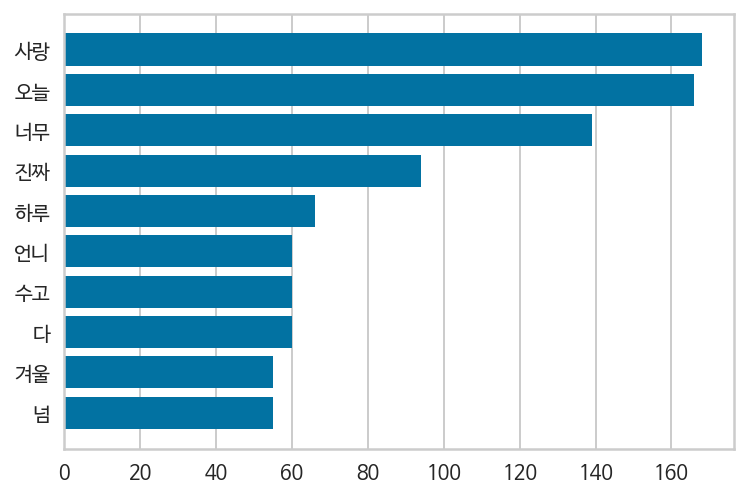

In [ ]:
from yellowbrick.text import FreqDistVisualizer
visualizer = FreqDistVisualizer(features=vect.get_feature_names(), orient='h', n=10)
visualizer.fit(dtm_vect);

## 통계적 트리밍 적용
- 토큰의 분포를 살펴보고 통계적 트리밍을 적용해보자.
- 통계적 트리밍을 통해 출현빈도 1% 이상 ~ 20% 미만인 단어로 제한해보았다.

In [ ]:
from collections import Counter

def word_count(docs):
    """ 토큰화된 문서들을 입력받아 토큰을 카운트 하고 관련된 속성을 가진 데이터프레임을 리턴합니다.
    Args:
        docs (series or list): 토큰화된 문서가 들어있는 list
    Returns:
        list: Dataframe
    """
    # 전체 코퍼스에서 단어 빈도 카운트
    word_counts = Counter()

    # 단어가 존재하는 문서의 빈도 카운트, 단어가 한 번 이상 존재하면 +1
    word_in_docs = Counter()

    # 전체 문서의 갯수
    total_docs = len(docs)

    for doc in docs:
        word_counts.update(doc)
        word_in_docs.update(set(doc))

    temp = zip(word_counts.keys(), word_counts.values())

    wc = pd.DataFrame(temp, columns = ['word', 'count'])

    # 단어의 순위
    # method='first': 같은 값의 경우 먼저나온 요소를 우선
    wc['rank'] = wc['count'].rank(method='first', ascending=False)
    total = wc['count'].sum()

    # 코퍼스 내 단어의 비율
    wc['percent'] = wc['count'].apply(lambda x: x / total)

    wc = wc.sort_values(by='rank')

    # 누적 비율
    # cumsum() : cumulative sum
    wc['cul_percent'] = wc['percent'].cumsum()

    temp2 = zip(word_in_docs.keys(), word_in_docs.values())
    ac = pd.DataFrame(temp2, columns=['word', 'word_in_docs'])
    wc = ac.merge(wc, on='word')
    
    # 전체 문서 중 존재하는 비율
    wc['word_in_docs_percent'] = wc['word_in_docs'].apply(lambda x: x / total_docs)

    return wc.sort_values(by='rank')

In [ ]:
wc = word_count(df_kd['preprocessed'])

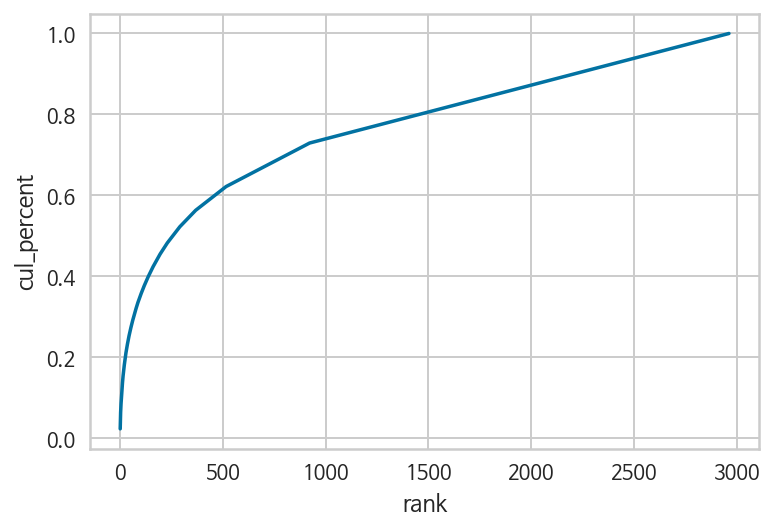

In [ ]:
import seaborn as sns

# 누적분포그래프(CDF)
sns.lineplot(x='rank', y='cul_percent', data=wc);

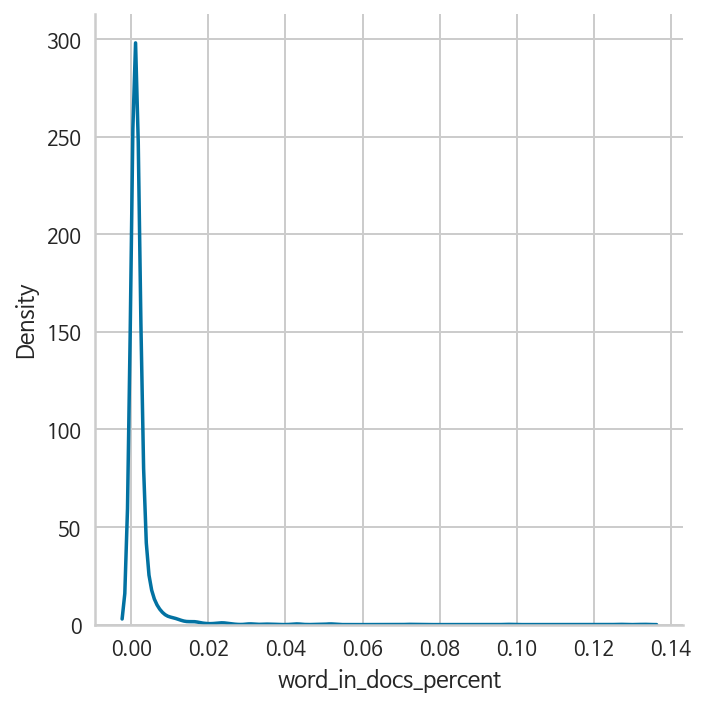

In [ ]:
# 문서에 나타나는 빈도
sns.displot(wc['word_in_docs_percent'],kind='kde');

In [ ]:
wc_trim = wc[(wc['word_in_docs_percent'] >= 0.01) & (wc['word_in_docs_percent'] < 0.2)]
wc_trim

,word,word_in_docs,count,rank,percent,cul_percent,word_in_docs_percent
70,사랑,144,168,1.0,0.022320,0.022320,0.126872
4,오늘,151,166,2.0,0.022054,0.044374,0.133040
51,너무,111,139,3.0,0.018467,0.062840,0.097797
63,진짜,82,94,4.0,0.012488,0.075329,0.072247
7,하루,59,66,5.0,0.008768,0.084097,0.051982
...,...,...,...,...,...,...,...
1044,보내,13,13,80.0,0.001727,0.323236,0.011454
42,밤,12,12,82.0,0.001594,0.326558,0.010573
157,무대,12,12,83.0,0.001594,0.328152,0.010573
291,돼,12,12,84.0,0.001594,0.329746,0.010573


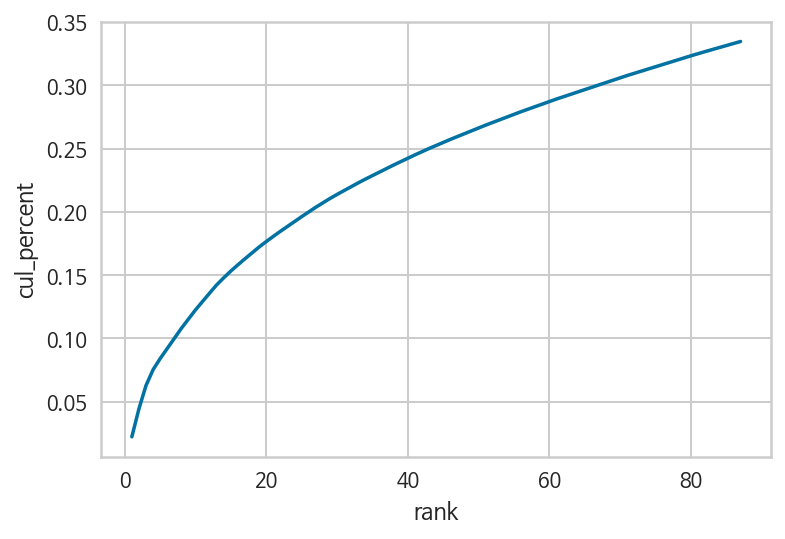

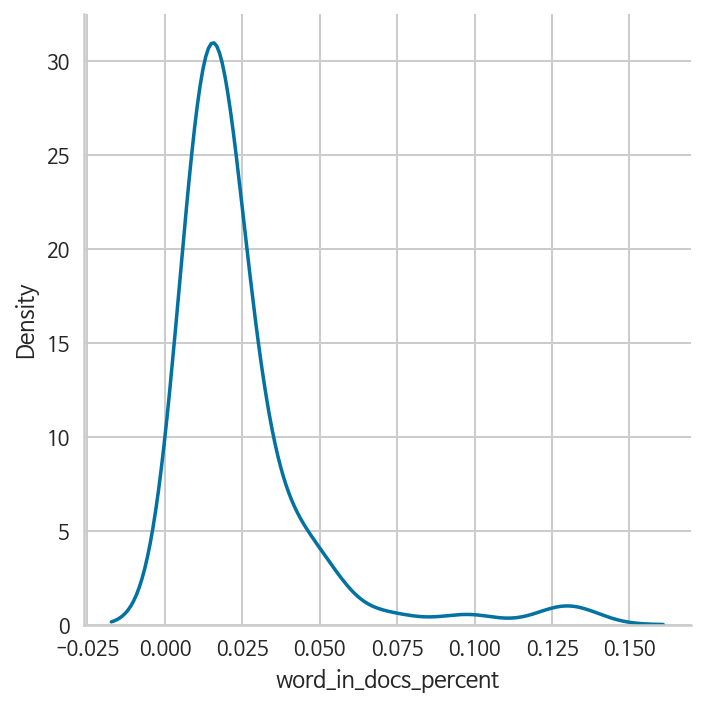

In [ ]:
sns.lineplot(x='rank', y='cul_percent', data=wc_trim)
sns.displot(wc_trim['word_in_docs_percent'], kind='kde');

- 특정 단어에 비중이 몰려있지 않아서, 상위 10개 단어를 선정했을 때 통계적 트리밍 전후 결과가 같았다.

# 5 TF-IDF(Term Frequency – Inverse Document Frequency) Vectorizer
- CountVectorizer는 단어 갯수를 그대로 카운트한 반면,
- TF-IDF는 모든 문서에 공통적으로 들어있는 단어의 경우 문서 구별 능력이 떨어진다고 보아 가중치를 축소하는 방법이다.

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer


vect_tf = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False)
 
dtm_vect_tf = vect_tf.fit_transform(df_kd['preprocessed'])

In [ ]:
vect_tf.vocabulary_

{'애기야': 1662,
 '쉬는': 1417,
 '날': 381,
 '모하': 948,
 '니': 486,
 '민정': 1027,
 '이랑': 2012,
 '강거': 46,
 '오늘': 1839,
 '좋은': 2342,
 '하루': 2746,
 '보냐': 1182,
 '겨울': 102,
 '즐': 2384,
 '주보': 2354,
 '머글': 861,
 '친구': 2566,
 '호캉스중': 2900,
 '인데': 2051,
 '포카': 2683,
 '씩': 1538,
 '강제': 50,
 '쥐어주고': 2380,
 '사진': 1321,
 '찍음': 2471,
 '냠냠': 425,
 '나도': 356,
 '족발': 2296,
 '먹었어': 892,
 '맛있는거': 835,
 '먹으렴': 895,
 '밤': 1072,
 '보낸': 1177,
 '걸': 91,
 '이제': 2040,
 '쓰는': 1526,
 '잠오는데': 2208,
 '잠': 2202,
 '오는': 1837,
 '느낌': 479,
 '아냐면서': 1548,
 '먼저': 910,
 '자러': 2154,
 '간': 23,
 '날씨': 385,
 '너무': 428,
 '좋고': 2316,
 '예쁘다는': 1822,
 '뜻': 721,
 '나른한': 357,
 '일요일': 2072,
 '오후': 1852,
 '보내고': 1155,
 '있길': 2098,
 '바라': 1035,
 '아주': 1583,
 '좋다구': 2320,
 '잠좀푹': 2211,
 '자써': 2163,
 '방송': 1081,
 '못': 958,
 '봐서': 1223,
 '보고시퍼': 1134,
 '팬싸': 2662,
 '후기': 2927,
 '보는데': 1189,
 '넘': 434,
 '보고싶고': 1136,
 '얘기': 1689,
 '싶고': 1497,
 '그렇다': 214,
 '진짜': 2428,
 '상황': 1337,
 '빨리': 1287,
 '좋아져서': 2322,
 '실제': 1486,
 '보게': 1132,
 '힘낼게': 2

In [ ]:
dtm_mat_tf = pd.DataFrame(dtm_vect_tf.todense(), columns=vect_tf.get_feature_names())
print(type(dtm_mat_tf))
dtm_mat_tf

<class 'pandas.core.frame.DataFrame'>


,가는,가능하게,가능한거냐,가능해,가득,가득하길,가득하다,가득할거야,가락,가만,가면,가버린,가봐,가사,가수,가시,가시노,가온,가장,가져도,가족,가준,각기,간,간다,간수,간전,간지나,간파,갈,갈거,갈거란,갈수록,갈았겠,감,감동,감든다,감사하겠어요,감사합니다,감사해요,...,활동,회복하려면,회사,회원,효녀,효녀깅,후기,후딱,후회,훅,흐,흑,흑백,흔든,흔들란다,흘리는,흘림,희,흰둥이,히,힐링,힘,힘내,힘내고,힘내는,힘내서,힘내자,힘내자구,힘낼게,힘들겠지만,힘들고,힘들다아,힘들어서,힘들었겠지,힘들었겠지만,힘들었을,힘들었지,힘차게,힛,힝
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.28904,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1131,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1132,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1133,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
df2 = dtm_mat_tf.copy()
df2.loc['total'] = df2.select_dtypes(pd.np.number).sum()
df2

,가는,가능하게,가능한거냐,가능해,가득,가득하길,가득하다,가득할거야,가락,가만,가면,가버린,가봐,가사,가수,가시,가시노,가온,가장,가져도,가족,가준,각기,간,간다,간수,간전,간지나,간파,갈,갈거,갈거란,갈수록,갈았겠,감,감동,감든다,감사하겠어요,감사합니다,감사해요,...,활동,회복하려면,회사,회원,효녀,효녀깅,후기,후딱,후회,훅,흐,흑,흑백,흔든,흔들란다,흘리는,흘림,희,흰둥이,히,힐링,힘,힘내,힘내고,힘내는,힘내서,힘내자,힘내자구,힘낼게,힘들겠지만,힘들고,힘들다아,힘들어서,힘들었겠지,힘들었겠지만,힘들었을,힘들었지,힘차게,힛,힝
0,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.289040,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,

In [ ]:
df2.T.sort_values(by='total', ascending=False).head(30)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,1096,1097,1098,1099,1100,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,1111,1112,1113,1114,1115,1116,1117,1118,1119,1120,1121,1122,1123,1124,1125,1126,1127,1128,1129,1130,1131,1132,1133,1134,total
사랑,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.093532,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.237705,0.0,0.0,0.166298,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.191063,0.000000,0.239157,0.000000,0.000000,0.000000,0.195701,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.178592,0.0,0.115407,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.229924,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.318341,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,40.865235
오늘,0.140466,0.000000,0.108705,0.0,0.133818,0.261353,0.092090,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.174677,0.0,0.106997,0.000000,0.000000,0.188118,0.063275,0.117735,0.000000,0.291554,0.000000,0.192684,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.125546,0.465043,0.213359,0.0,0.188915,0.202192,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.207917,0.000000,0.465043,0.0,0.000000,0.169118,0.000000,0.0,0.226380,0.192529,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.222917,0.313434,0.000000,0.098271,0.000000,0.000000,0.098407,0.000000,0.0,33.908697
너무,0.000000,0.000000,0.000000,0.0,0.147389,0.000000,0.101429,0.0,0.0,0.0,0.0,0.0,0.088328,0.000000,0.0,0.0,0.257775,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.321120,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.276556,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,27.108773
잘자,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.224188,0.0,0.000000,0.0,0.000000,0.000000,0.345432,0.000000,0.086638,0.000000,0.000000,0.399201,0.616737,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.198765,0.0,0.000000,0.000000,0.000000,0.429159,0.394205,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,25.153174
진짜,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.110592,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.562127,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.151977,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.136458,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.258389,0.000000,0.000000,0.000000,0.0,21.483380
수고,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.396478,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.381549,0.000000,0.252161,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.291726,0.410183,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,17.970990
하루,0.183825,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.0,0.214275,0.0,0.000000,0.0,0.280049,0.000000,0.000000,0.246185,

- 상위 10개 단어를 시각화 하기

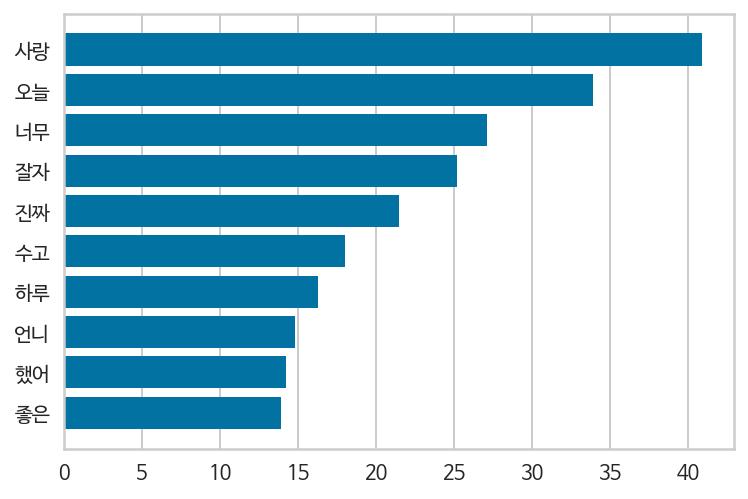

In [ ]:
from yellowbrick.text import FreqDistVisualizer
visualizer = FreqDistVisualizer(features=vect_tf.get_feature_names(), orient='h', n=10)
visualizer.fit(dtm_vect_tf);

- CountVectorizer, TfidfVectorizer 사용 시 전처리에서 이미 관사, 조사 등을 정리하여 결과가 크게 다르지는 않았다.
- 그러나 결과가 주요 단어로 나오기 때문에 문맥을 이해하기 어려우며 엉뚱하게 해석할 가능성이 있다.
- 따라서, **단어가 아닌 문장으로 요약하는** 방식이 더 적합하겠다는 판단을 했다.

# 6 TextRank Summarizer
- TextRank를 활용하면 TF-IDF를 활용하여 각 단어의 가중치를 계산한 후 그래프를 생성하여 각 문장의 랭킹을 계산함으로써 주요 문장으로 요약할 수 있다.
- TextRank는 구글의 검색알고리즘인 **PageRank를 텍스트에 적용**한 것이며, 
- PageRank는 웹페이지를 인용하고 있는 다른 페이지들이 가진 페이지 랭크를 정규화한 값의 합으로 해당 웹페이지의 페이지 랭크를 구한다.
- 따라서 **TextRank는 각 문장들을 노드로, 문장들 간 유사도를 간선의 값으로 사용하여 그래프를 만든 후 PageRank 알고리즘을 적용하여 문장의 랭킹을 계산**한다.

<br>

- **TextRank Summarizer**는 기존의 TextRank 방식에서 TF-IDF 대신 **BM25**라는 스코어 알고리즘을 적용한 것으로, 
- TF-IDF의 TF 계산에서 <u>**문서 길이를 반영**</u>한다는 특징이 있으며, 성능이 일부 개선되었다.
  - ex) 열 페이지가 넘는 문서에서 어떤 단어가 한 번 언급되는 것과, 트위터같은 짧은 문장에서 단어가 한 번 언급되는 것 중에서는 두 번째 경우가 더 의미 있다고 보는 것.
- gensim 라이브러리의 summerize 모듈을 통해 활용할 수 있다. 
- Federico Barrios, Federico L´opez, Luis Argerich, Rosita Wachenchauzer (2016). Variations of the Similarity Function of TextRank for Automated Summarization : https://arxiv.org/abs/1602.03606

In [ ]:
pip install gensim

In [ ]:
from gensim.summarization.summarizer import summarize

In [ ]:
tweets = df_k['tweet'].tolist()
tweets

['#유지민은봐라 애기야 쉬는날에 모하니?? 민정이랑 한강거니 오늘도...?? 좋은하루보냐💙',
 '#유지민은봐라 #겨울이버블\n즐주보내\U0001f972\U0001f90d\U0001f90d https://t.co/z6uTJW0epa',
 '머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 족발 먹었어🐷 너도 오늘 맛있는거 먹으렴💙 #유지민은봐라 https://t.co/4UXgPWPRxP',
 '#유지민은봐라 밤에 보낸걸 이제 쓰는 나... 잠오는데 잠 안오는 느낌 뭔지 아냐면서 ㅋㅋㅋㅋ 먼저 자러간 지민이',
 '오늘 날씨 지민이 같아~ 너무 좋고 예쁘다는 뜻!! 나른한 일요일 오후 보내고 있길 바라,, #유지민은봐라',
 '#유지민은봐라 지민아 오늘 아주 날씨가 좋다구 https://t.co/QjLOYixb4y',
 '#유지민은봐라\n\n지민아 잠좀푹자써?? 오늘은 방송에서 못봐서 너무 보고시퍼ㅜㅜㅜ 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고,, 얘기하고 싶고 그렇다 진짜 ㅜㅜㅜ 상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해💙',
 '헐!!!! #유지민은봐라 @aespa_official https://t.co/t0ZuvRBM2t',
 '헐 #유지민은봐라 https://t.co/xPHiQW1q8g',
 '이게 봐!! #유지민은봐라 https://t.co/F71vSBDY68',
 '#유지민은봐라 지민아ㅏ!!!!! https://t.co/xCi7UPbnmB',
 '#유지민은봐라 지민아!!!!! https://t.co/Kq9OZ99OOD',
 '#유지민은봐라\n내가 전문가는 아니지만 그저 보고 느끼기에 민이 춤출 때 동작마다 확실하게 잡아주고 강약조절 하니까 춤이 쫀득한 거 같아 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 난 그 에너지가 너무 좋아 앞으로 더 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어💙',
 '#리나버블\n#유지민은봐라\n\n매일 수고했어~\U0001f972💙 h

In [ ]:
import re
letters_only = []
for i in tweets:
  letters_only.append(re.sub("[^가-힣 ]",  # Search for all non-letters
                          "",          # Replace all non-letters with spaces
                          str(i)))

In [ ]:
letters_only

['유지민은봐라 애기야 쉬는날에 모하니 민정이랑 한강거니 오늘도 좋은하루보냐',
 '유지민은봐라 겨울이버블즐주보내 ',
 '머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 족발 먹었어 너도 오늘 맛있는거 먹으렴 유지민은봐라 ',
 '유지민은봐라 밤에 보낸걸 이제 쓰는 나 잠오는데 잠 안오는 느낌 뭔지 아냐면서  먼저 자러간 지민이',
 '오늘 날씨 지민이 같아 너무 좋고 예쁘다는 뜻 나른한 일요일 오후 보내고 있길 바라 유지민은봐라',
 '유지민은봐라 지민아 오늘 아주 날씨가 좋다구 ',
 '유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜  상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해',
 '헐 유지민은봐라  ',
 '헐 유지민은봐라 ',
 '이게 봐 유지민은봐라 ',
 '유지민은봐라 지민아 ',
 '유지민은봐라 지민아 ',
 '유지민은봐라내가 전문가는 아니지만 그저 보고 느끼기에 민이 춤출 때 동작마다 확실하게 잡아주고 강약조절 하니까 춤이 쫀득한 거 같아 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 난 그 에너지가 너무 좋아 앞으로 더 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어',
 '리나버블유지민은봐라매일 수고했어 ',
 '지민아 유지민은봐라 카리나버블 ',
 '짐나 어케 유지민은봐라 ',
 '지민아 진짜 이때 춤을 했을때 너무 좋아 진짜 사랑이 빠졌다 유지민은봐라 ',
 '착한아이 완곡으로 불러줄 유지민 구함 유지민은봐라 ',
 '맞아요 지민이 기운을 회복하려면 벌써 잠을 자야 해요  잘쟈 유지민은봐라',
 '유지민은봐라 지민아 사랑해 너가 세상에서 제일 좋아  잘자 푹자고 내일 또 행복한 얼굴로 좋은 하루 다시 시작하자',
 '세계 멋있는 예쁘고 최고의 아이돌에게 우리 지민이 잘자요 유지민은봐라',
 '잘했어 오늘  열심히 일 해주셔서 고마웡 지구젤리버블 유지민은봐라겨울이버블 윈

In [ ]:
letters_str = " \n ".join(letters_only)
letters_str

'유지민은봐라 애기야 쉬는날에 모하니 민정이랑 한강거니 오늘도 좋은하루보냐 \n 유지민은봐라 겨울이버블즐주보내  \n 머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 족발 먹었어 너도 오늘 맛있는거 먹으렴 유지민은봐라  \n 유지민은봐라 밤에 보낸걸 이제 쓰는 나 잠오는데 잠 안오는 느낌 뭔지 아냐면서  먼저 자러간 지민이 \n 오늘 날씨 지민이 같아 너무 좋고 예쁘다는 뜻 나른한 일요일 오후 보내고 있길 바라 유지민은봐라 \n 유지민은봐라 지민아 오늘 아주 날씨가 좋다구  \n 유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜  상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해 \n 헐 유지민은봐라   \n 헐 유지민은봐라  \n 이게 봐 유지민은봐라  \n 유지민은봐라 지민아  \n 유지민은봐라 지민아  \n 유지민은봐라내가 전문가는 아니지만 그저 보고 느끼기에 민이 춤출 때 동작마다 확실하게 잡아주고 강약조절 하니까 춤이 쫀득한 거 같아 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 난 그 에너지가 너무 좋아 앞으로 더 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어 \n 리나버블유지민은봐라매일 수고했어  \n 지민아 유지민은봐라 카리나버블  \n 짐나 어케 유지민은봐라  \n 지민아 진짜 이때 춤을 했을때 너무 좋아 진짜 사랑이 빠졌다 유지민은봐라  \n 착한아이 완곡으로 불러줄 유지민 구함 유지민은봐라  \n 맞아요 지민이 기운을 회복하려면 벌써 잠을 자야 해요  잘쟈 유지민은봐라 \n 유지민은봐라 지민아 사랑해 너가 세상에서 제일 좋아  잘자 푹자고 내일 또 행복한 얼굴로 좋은 하루 다시 시작하자 \n 세계 멋있는 예쁘고 최고의 아이돌에게 우리 지민이 잘자요 유지민은봐라 \n 잘했어 오늘  열심히 일 해주셔서 고마웡 지구젤리버블 유지민은봐라겨울이버블 윈터버블 닝깅이에게 \n 유지민은봐라 지민

In [ ]:
words = letters_str.split(' ')
words

['유지민은봐라',
 '애기야',
 '쉬는날에',
 '모하니',
 '민정이랑',
 '한강거니',
 '오늘도',
 '좋은하루보냐',
 '\n',
 '유지민은봐라',
 '겨울이버블즐주보내',
 '',
 '\n',
 '머글친구들이랑',
 '호캉스중인데',
 '포카',
 '하나씩',
 '강제로',
 '쥐어주고',
 '사진찍음',
 '냠냠',
 '지민아',
 '나도',
 '족발',
 '먹었어',
 '너도',
 '오늘',
 '맛있는거',
 '먹으렴',
 '유지민은봐라',
 '',
 '\n',
 '유지민은봐라',
 '밤에',
 '보낸걸',
 '이제',
 '쓰는',
 '나',
 '잠오는데',
 '잠',
 '안오는',
 '느낌',
 '뭔지',
 '아냐면서',
 '',
 '먼저',
 '자러간',
 '지민이',
 '\n',
 '오늘',
 '날씨',
 '지민이',
 '같아',
 '너무',
 '좋고',
 '예쁘다는',
 '뜻',
 '나른한',
 '일요일',
 '오후',
 '보내고',
 '있길',
 '바라',
 '유지민은봐라',
 '\n',
 '유지민은봐라',
 '지민아',
 '오늘',
 '아주',
 '날씨가',
 '좋다구',
 '',
 '\n',
 '유지민은봐라지민아',
 '잠좀푹자써',
 '오늘은',
 '방송에서',
 '못봐서',
 '너무',
 '보고시퍼',
 '팬싸',
 '후기들',
 '보는데',
 '나도',
 '지민이',
 '넘넘',
 '보고싶고',
 '얘기하고',
 '싶고',
 '그렇다',
 '진짜',
 '',
 '상황이',
 '빨리',
 '좋아져서',
 '실제로',
 '지민이',
 '보게되는',
 '날까지',
 '힘낼게',
 '지민아',
 '사랑해',
 '\n',
 '헐',
 '유지민은봐라',
 '',
 '',
 '\n',
 '헐',
 '유지민은봐라',
 '',
 '\n',
 '이게',
 '봐',
 '유지민은봐라',
 '',
 '\n',
 '유지민은봐라',
 '지민아',
 '',
 '\n',
 '유지민은봐라',
 '지민아',
 '',
 '\n',
 '유지민은봐라내가',
 '

In [ ]:
stop_words_sorted = list(dict.fromkeys(sorted(stop_words)))
stop_words_sorted.remove('\n')

In [ ]:
stop_words_sorted

['',
 '#겨울이버블',
 '#리나버블',
 '#유지민은봐라',
 '#카리나버블',
 '가',
 '가까스로',
 '가령',
 '가서',
 '가지',
 '각',
 '각각',
 '각자',
 '각종',
 '갖고말하자면',
 '같',
 '같다',
 '같아',
 '같은',
 '같이',
 '개',
 '개의치않고',
 '거',
 '거니와',
 '거바',
 '거의',
 '것',
 '것과',
 '것들',
 '게\n',
 '게다가',
 '게우다',
 '겨우',
 '겨울이버블',
 '견지에서',
 '결과에',
 '결국',
 '결론을',
 '겸사겸사',
 '경우',
 '고',
 '고려하면',
 '고로',
 '곧',
 '과',
 '과연',
 '관계가',
 '관계없이',
 '관련이',
 '관하여',
 '관한',
 '관해서는',
 '구',
 '구체적으로',
 '구토하다',
 '그',
 '그것',
 '그들',
 '그때',
 '그래',
 '그래도',
 '그래서',
 '그러',
 '그러나',
 '그러니',
 '그러니까',
 '그러면',
 '그러므로',
 '그러한즉',
 '그런',
 '그런데',
 '그런즉',
 '그럼',
 '그럼에도',
 '그렇',
 '그렇게',
 '그렇지',
 '그렇지만',
 '그렇지않으면',
 '그리고',
 '그리하여',
 '그만이다',
 '그에',
 '그위에',
 '그저',
 '그중에서',
 '그치지',
 '근거로',
 '근거하여',
 '기대여',
 '기점으로',
 '기준으로',
 '기타',
 '김에',
 '까닭에',
 '까닭으로',
 '까악',
 '까지',
 '까지도',
 '꽈당',
 '끙끙',
 '끼익',
 '나',
 '나머지는',
 '나오',
 '난',
 '남들',
 '남짓',
 '낫다',
 '내',
 '낼',
 '너',
 '너희',
 '너희들',
 '네',
 '넷',
 '년',
 '년도',
 '논하지',
 '놀라다',
 '놓',
 '누가',
 '누구',
 '는',
 '닝깅이에게',
 '다른',
 '다만',
 '다섯',
 '다소',
 '다수',
 '다시',
 '

In [ ]:
without_sw = ''
for w in words:
  if w not in stop_words_sorted:
    without_sw += w +' '
without_sw

'애기야 쉬는날에 모하니 민정이랑 한강거니 오늘도 좋은하루보냐 \n 겨울이버블즐주보내 \n 머글친구들이랑 호캉스중인데 포카 하나씩 강제로 쥐어주고 사진찍음 냠냠 지민아 나도 족발 먹었어 너도 오늘 맛있는거 먹으렴 \n 밤에 보낸걸 이제 쓰는 잠오는데 잠 안오는 느낌 뭔지 아냐면서 먼저 자러간 지민이 \n 오늘 날씨 지민이 너무 좋고 예쁘다는 뜻 나른한 일요일 오후 보내고 있길 바라 \n 지민아 오늘 아주 날씨가 좋다구 \n 유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜 상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해 \n 헐 \n 헐 \n 이게 \n 지민아 \n 지민아 \n 유지민은봐라내가 전문가는 아니지만 보고 느끼기에 민이 춤출 동작마다 확실하게 잡아주고 강약조절 춤이 쫀득한 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 에너지가 너무 앞으로 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어 \n 리나버블유지민은봐라매일 수고했어 \n 지민아 \n 짐나 어케 \n 지민아 진짜 춤을 했을때 너무 진짜 사랑이 빠졌다 \n 착한아이 완곡으로 불러줄 구함 \n 맞아요 지민이 기운을 회복하려면 벌써 잠을 자야 잘쟈 \n 지민아 사랑해 너가 세상에서 제일 잘자 푹자고 내일 행복한 얼굴로 좋은 하루 시작하자 \n 세계 멋있는 예쁘고 최고의 아이돌에게 지민이 잘자요 \n 잘했어 오늘 열심히 해주셔서 고마웡 유지민은봐라겨울이버블 \n 지민아 네가 제일 좋다 \n 지민아 잠에게 졌지만 싸웠어 오늘 무대 넘넘 멋있고 예뻤고 팬싸 스케줄까지 아조 야무진 하루였네푹 자고 내일도 좋은 하루 보내자 \n 건강하고 많이 쉬세요 \n 잘자 푹자고 내일 놀자 \n 지미나 푹 자고 좋은 꿈 꿔오늘 하루도 고생많았다사랑해 \n 지미낭 잘자 오늘진짜진짜진짜최고였어 노래도 진짜진짜진짜진짜잘했구 춤도 진짜진짜진짜진짜진짜진짜 잘해써 대박 콩깍지씌어서 하는말이 진짜 잘했다니

In [ ]:
print(summarize(without_sw, word_count=50))

유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜 상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해 
오늘 데뷔 일이래 너무너무 축하한다구우우우 일동안 지민이 보면서 행복했지 앞으로 오래오래 마이 하기로 약속 오늘은 특별한 날이니까 어제보다 행복하게 보냈으면 좋겠어 사랑해 리나야 지민아 
잘자 오늘도 수고했어 고마워 사랑해 


In [ ]:
print(summarize(without_sw, ratio = 0.01))

유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜 상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해 
지민아 사랑해 너가 세상에서 제일 잘자 푹자고 내일 행복한 얼굴로 좋은 하루 시작하자 
사랑한다는 말이 사라진다면 사랑을 이라고 할래 오늘도 지민이 덕분에 많이 힘도 얻고 웃는 하루였던 울 지민이도 좋은 밤 되길 잘자고 이따 
유지민은봐라지민아 오늘도 수고 많았어 좋은꿈 꾸고 내일도 행복한 하루 보내 사랑해 
오늘 데뷔 일이래 너무너무 축하한다구우우우 일동안 지민이 보면서 행복했지 앞으로 오래오래 마이 하기로 약속 오늘은 특별한 날이니까 어제보다 행복하게 보냈으면 좋겠어 사랑해 리나야 지민아 
지미나 오늘도 수고했어 사랑해 집 푹 쉬자 
유지민은봐라지민아 오늘도 행복한 하루 보내 사랑해 
지민이 세상에서 제일 사랑해 
지민아 데뷔해줘서 고마워 정말 사랑해 나는 항상 너를 응원할 거야 
잘자 오늘도 수고했어 고마워 사랑해 


## TextRank 함수생성
- 위에서 적용한 메쏘드들을 정리해서 하나의 함수로 표현하고
- 다른 데이터에 적용하여 결과를 확인해보자.

In [ ]:
from gensim.summarization.summarizer import summarize
import re
import time

In [ ]:
# textrank 함수 생성

def textrank(sentence, ratio):
  # 시간 측정 시작
  start = time.time()

  # 트윗 데이터 가져오기
  tweets = sentence.tolist()

  # 정규표현식 적용
  letters_only = []
  for i in tweets:
    letters_only.append(re.sub("[^가-힣 ]",  # Search for all non-letters
                          "",          # Replace all non-letters with spaces
                          str(i)))
    
  letters_str = " \n ".join(letters_only)
  words = letters_str.split(' ')
  
  # 불용어 정리, 트윗 줄바꿈 남겨주기
  stop_words_sorted = list(dict.fromkeys(sorted(stop_words)))
  stop_words_sorted.remove('\n')

  # 불용어처리 적용
  without_sw = ''
  for w in words:
    if w not in stop_words_sorted:
      without_sw += w +' '
  
  # 요약 적용(ratio로 요약할 비율 적용)
  print(summarize(without_sw, ratio = ratio))

  # 시간 측정 끝
  print('=====','\n','실행 시간:',time.time()-start,'sec')

  return

- 먼저, 같은 데이터로 위에서 했던 요약과 동일한 결과가 나오는지 확인해 보았다.

In [ ]:
textrank(df_k['tweet'],0.01)

유지민은봐라지민아 잠좀푹자써 오늘은 방송에서 못봐서 너무 보고시퍼 팬싸 후기들 보는데 나도 지민이 넘넘 보고싶고 얘기하고 싶고 그렇다 진짜 상황이 빨리 좋아져서 실제로 지민이 보게되는 날까지 힘낼게 지민아 사랑해 
지민아 사랑해 너가 세상에서 제일 잘자 푹자고 내일 행복한 얼굴로 좋은 하루 시작하자 
사랑한다는 말이 사라진다면 사랑을 이라고 할래 오늘도 지민이 덕분에 많이 힘도 얻고 웃는 하루였던 울 지민이도 좋은 밤 되길 잘자고 이따 
유지민은봐라지민아 오늘도 수고 많았어 좋은꿈 꾸고 내일도 행복한 하루 보내 사랑해 
오늘 데뷔 일이래 너무너무 축하한다구우우우 일동안 지민이 보면서 행복했지 앞으로 오래오래 마이 하기로 약속 오늘은 특별한 날이니까 어제보다 행복하게 보냈으면 좋겠어 사랑해 리나야 지민아 
지미나 오늘도 수고했어 사랑해 집 푹 쉬자 
유지민은봐라지민아 오늘도 행복한 하루 보내 사랑해 
지민이 세상에서 제일 사랑해 
지민아 데뷔해줘서 고마워 정말 사랑해 나는 항상 너를 응원할 거야 
잘자 오늘도 수고했어 고마워 사랑해 
===== 
 실행 시간: 2.2462873458862305 sec


- 동일한 결과가 나온 것을 확인하여, 함수가 정상적으로 생성되었음을 알 수 있다.


- 다른 데이터에도 적용하여 결과를 확인해보자.

In [ ]:
textrank(df_w['tweet'],0.01)

민정아 넥스트레벨 활동동안 최선을 다해서 예쁘고 멋진 모습 보여줘서 고마웠어 민정이는 언제든 잘할거란 믿음이 있었지만 팬의 이기적인 기대마저 넘은 모습으로 무대위를 날아다닌 민정이 안보이는 곳에서 연습하고 연구하고 고생했을까 싶네 
민정아 오늘 날씨도 좋았는디 어땠니 오늘 민정이 하루는 죤 하루 됐길 바란다글고 사랑해 
민정아 데뷔 너무 너무 축하해 민정이가 에스파 윈터로서 이정도면 만족한다 있을때까지 평생 응원할게 데뷔해줘서 너무 고마워 예쁘고 멋있고 잘생기고 귀엽고 사랑스러운거 다 본업 천재 김민정 앞으로도 다 윈터야 오래보자 
민정아 오늘이 데뷔 일이래 버블도 벌써 일이고 민정이 좋아한 시간이 빨리 흐른 앞으로 오래오래 장수아이돌 좋아할거니까 어제 먹은 것보다 맛있는거 다같이 먹으면서 즐겁게 보냈으면 좋겠어 최고의 금요일을 보내길 오래 보자 사랑해 
민정아 오늘도 하띵 비오니까 따숩게 입어요 사랑해 
민정아 오늘 역대급으로 재밌었다 오늘도 수고했어 대유잼 그룹 에스파 
오늘도 너무 사랑해 김민정 
===== 
 실행 시간: 1.3543572425842285 sec


- 6월 7일 하루동안의 데이터만 요약 분석 해 보았다.

In [ ]:
textrank(df_w_67['tweet'],0.01)

윈터버블윈터 사장님 인심이 너무 후해서 마이들 배터져요 마이들 배 터지게 죄로 감옥가기 싫으면 편하게 부담없이 해주기 오늘뿐만이 언제나 민정이는 마이들 마음에 안착해있다는 걸 알아줬으면 민정이가 뭘 하든 항상 존재 자체로 고맙고 응원해 사랑해 애기 
민정아 오늘만 마음에 드는 아니구 진짜 알고난 이후로 항상 그랬어 매일매일 민정이 사랑하는 마음이 커지고 있다구 언제나 사랑만 줄게 진짜 너무 사랑해 
겨울이버블오늘 놀아줘서 고마워 항상 부담갖지말구 편하게 버블맛집 윈터 민정이의 버블덕분에 오늘밤은 행복하게 잠들수있을거같아 그러구 민정이는 오늘이 항상 매일 마음에들어 자구 항상 사랑만받자 사랑해 김민정 
오늘도 민정이 맘에 들었지만 민정이를 알게된 순간부터 모든 순간이 맘에 들었고 넘 좋았어 민정아 오늘도 푹 자고 푹 쉬어 항상 너무 고맙고 사랑해 
민정아 오늘두 민정이 땜에 행복했엉 사랑해 낼도 놀자 
진짜 민정아 내가 사랑해 항상 고마워 
쩡아 너무너무 사랑해 세상에서 제일 소중한 겨울이 민정아 내일 보자 내일도 널 사랑할게 
그냥진짜사랑만줘 민정이 겨울이 보내주는 셀카 텍스트 사랑해 
===== 
 실행 시간: 1.7489829063415527 sec


- 윈터님 데이터를 합쳐서(일주일+6월7일, 약 1500건) 요약 해 보았다.

In [ ]:
textrank(pd.concat([df_w['tweet'],df_w_67['tweet']]), 0.01)

민정아 넥스트레벨 활동동안 최선을 다해서 예쁘고 멋진 모습 보여줘서 고마웠어 민정이는 언제든 잘할거란 믿음이 있었지만 팬의 이기적인 기대마저 넘은 모습으로 무대위를 날아다닌 민정이 안보이는 곳에서 연습하고 연구하고 고생했을까 싶네 
민정아 오늘 날씨도 좋았는디 어땠니 오늘 민정이 하루는 죤 하루 됐길 바란다글고 사랑해 
귀여워 김민정 짱스파 앞으로 많이 행복하게 만들어주고싶어 많이 사랑해 
민정아 데뷔 너무 너무 축하해 민정이가 에스파 윈터로서 이정도면 만족한다 있을때까지 평생 응원할게 데뷔해줘서 너무 고마워 예쁘고 멋있고 잘생기고 귀엽고 사랑스러운거 다 본업 천재 김민정 앞으로도 다 윈터야 오래보자 
민정아 오늘이 데뷔 일이래 버블도 벌써 일이고 민정이 좋아한 시간이 빨리 흐른 앞으로 오래오래 장수아이돌 좋아할거니까 어제 먹은 것보다 맛있는거 다같이 먹으면서 즐겁게 보냈으면 좋겠어 최고의 금요일을 보내길 오래 보자 사랑해 
민정아 오늘도 하띵 비오니까 따숩게 입어요 사랑해 
민정아 오늘 하루는 어땠어 오랜만에 민정이 한테 편지도 썼어 예전에 편지 보니까 버블이랑 브이앱이랑 팬싸 꼭 했으면 좋겠다고 썼었는데 오늘은 다 이룬 상태로 편지를 쓰는게 신기했어 버블로 오늘 사진 세개 보내준거 너무 맘에 들어 잘자구 푹쉬어 사랑해 
오늘도 너무 사랑해 김민정 
민정아 오늘만 마음에 드는 아니구 진짜 알고난 이후로 항상 그랬어 매일매일 민정이 사랑하는 마음이 커지고 있다구 언제나 사랑만 줄게 진짜 너무 사랑해 
겨울이버블오늘 놀아줘서 고마워 항상 부담갖지말구 편하게 버블맛집 윈터 민정이의 버블덕분에 오늘밤은 행복하게 잠들수있을거같아 그러구 민정이는 오늘이 항상 매일 마음에들어 자구 항상 사랑만받자 사랑해 김민정 
오늘도 민정이 맘에 들었지만 민정이를 알게된 순간부터 모든 순간이 맘에 들었고 넘 좋았어 민정아 오늘도 푹 자고 푹 쉬어 항상 너무 고맙고 사랑해 
민정아 오늘두 민정이 땜에 행복했엉 사랑해 낼도 놀자 
진짜 민정아 내가 사랑해 항상 고마워 
쩡아 너무너무 사랑

- 결과를 보면 일주일의 기간동안 **매일 일반적으로 보낼 수 있는 메시지들**이 상위권에 랭크된 것을 볼 수 있다.
- **TextRank**는 문서 내에서 다른 문장들과 많은 연결관계를 가진 문장에 높은 중요도를 부여하는 경향이 있기 때문에
- **다양한 대화 주제를 반영하지 못하고 반복적으로 등장하는 내용을 상위에 랭크**시킨 것으로 보인다.

- **실행 시간**을 보면, 1000 ~ 1500건의 트윗을 1퍼센트로 요약하는데 2 ~ 6초 정도가 걸려서 **상당히 빠르다**는 것을 알 수 있다. *(Colab Pro 기준)*


# 7 lexrankr
- LexRank는 추출 기반 다중 문서 요약 방법으로,
- TextRank의 **그래프에 클러스터링을 적용**하여 **주제가 다양한 문서를 요약**하는데 사용된다.
- 크기가 큰 클러스터부터, **각 클러스터 내에서 가장 랭킹이 높은 문장**을 뽑는다.
- lexrankr은 LexRank를 기반으로 한국어로 된 긴 문서에 적합하도록 구현한 파이썬 패키지이다.

- 설진석, 이상구. "lexrankr: LexRank 기반 한국어 다중 문서 요약." 한국정보과학회 학술발표논문집 (2016): 458-460. https://www.eiric.or.kr/community/post2.php?m=view&gubun=201612&num=6769


In [ ]:
pip install lexrankr

In [ ]:
from lexrankr import LexRank
lexrank = LexRank(preprocess_sentence)
lexrank.summarize(letters_str)

summaries = lexrank.probe(.1)
for i, summary in enumerate(summaries):
  print(str(i), summary)

0 유지민은봐라 애기야 쉬는날에 모하니 민정이랑 한강거니 오늘도 좋은하루보냐
1 오늘 날씨 지민이 같아 너무 좋고 예쁘다는 뜻 나른한 일요일 오후 보내고 있길 바라 유지민은봐라
2 유지민은봐라내가 전문가는 아니지만 그저 보고 느끼기에 민이 춤출 때 동작마다 확실하게 잡아주고 강약조절 하니까 춤이 쫀득한 거 같아 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 난 그 에너지가 너무 좋아 앞으로 더 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어
3 유지민은봐라    건강하고 많이 쉬세요
4 유지민은봐라 지미나 푹 자고 좋은 꿈 꿔오늘 하루도 고생많았다사랑해
5 유지민은봐라 언니 잘자 오늘 너무 수고했다
6 유지민은봐라 카리나버블 피곤하면 자고 돼용  무리하지마 오늘 무대도 하고 팬싸도 하고 엄청 피곤할텐뎅
7 유지민은봐라 그러다가 또 후회한다
8 유지민은봐라다크다크한거 좀더 없어 잘 찾아봐 몇장 더 있을거야 그 다크다크한거 버블로 마자 보내주면 돼
9 유지민은봐라 교복셀카
10 유지민은봐라 버블 들어가자마자 너무 놀랐어 사람이 맞나 싶을 정도로 예뻐서
11 유지민은봐라 흑백셀카 분위기 오져
12 오늘 지민정 무지개물고기 쿜쿜쿜유지민은봐라 겨울이버블
13 유지민은봐라지민아  어제 늦게자구 오늘 일찍인나구 밥도 아직 못먹은고야 내가 소고기 사주고싶다 오늘도 버블 와줘서 고마워 스윗메추리 유지민씨 많이 사랑해
14 이제야 버블 봤는데 이 언니들 너무 귀여운데 거짓말한 것도 귀엽다고 유지민은봐라
15 오또케송 찍어서 보내줘 지구젤리버블 유지민은봐라
16 저 도 알찬 하루였다카리나 유지민은봐라
17 유지민은봐라 잘자 울찌민
18 유지민은봐라 겨울이버블왜 끝나지가 않니
19 유지민은봐라아놬 애들아
20 겨울이버블 유지민은봐라 지구젤리버블  얘들아 그냥 거실에서 다같이 자면 안돼
21 유지민은봐라얼른 불 끄고 자 민둥 고만 괴롭혀
22 이럴 시간에 불 번은 껐겠다 유지민은봐라
23 유지민은봐라민정이 침대에서 일어나
24 카리나버블 유지민은봐라 지금 셀카찍기 지금

In [ ]:
from lexrankr import LexRank
lexrank1 = LexRank(preprocess_sentence)
lexrank1.summarize(without_sw)

summaries1 = lexrank1.probe(.1)
for i, summary in enumerate(summaries1):
  print(str(i), summary)

0 애기야 쉬는날에 모하니 민정이랑 한강거니 오늘도 좋은하루보냐
1 오늘 날씨 지민이 너무 좋고 예쁘다는 뜻 나른한 일요일 오후 보내고 있길 바라
2 유지민은봐라내가 전문가는 아니지만 보고 느끼기에 민이 춤출 동작마다 확실하게 잡아주고 강약조절 춤이 쫀득한 길쭉길쭉한데 힘도 있어서 온몸에서 파워가 발산되는 느낌이고 에너지가 너무 앞으로 성장할 춤짱 지민이가 기대된단 말을 해주고 싶었어
3 건강하고 많이 쉬세요
4 지미나 푹 자고 좋은 꿈 꿔오늘 하루도 고생많았다사랑해
5 언니 잘자 오늘 너무 수고했다
6 피곤하면 자고 돼용 무리하지마 오늘 무대도 팬싸도 엄청 피곤할텐뎅
7 그러다가 후회한다
8 지금 너무 언니덕에 고맙고 감동이고 울컥하고 자랑스럽고 기쁘고 행복한데 내가 감정을 표현 단어도 언어도 없어 그냥 무조건 대면에서 얼굴보고 진심을 보여주고시퍼 행복만 해줘 그냥 사랑만 받아줘
9 유지민은봐라다크다크한거 좀더 없어 찾아봐 몇장 있을거야 다크다크한거 버블로 마자 보내주면 돼
10 제발 유출해도된다규 버블보내죠 제발 부탁이야 너무 이뻐 공개적으로 유출해도된다고 버블한번만 제발
11 유지민은봐라나 지금 방바닥에 쓰러져서 울고있어
12 사진 보내고 말을 하시면
13 교복셀카
14 들어가자마자 너무 놀랐어 사람이 맞나 싶을 정도로 예뻐서
15 흑백셀카 분위기 오져
16 얼굴 보면서 울어
17 커버곡 풀어주라 제발
18 지민아 너무 멋있어
19 음중 봤어요 와아아앙 너무 멋지다 오늘도 수고했어욥
20 겨울이버블얘들아 맛점
21 취미 공유해달라구 버블했던거 이제 생각나따 외국 그림 보는거 좋아하는데 올려주시는 컬렉션이 취향에 맞아서 보고있으면 후딱 잘가 한번 들어가보는거 추천
22 유지민은봐라지민아 어제 늦게자구 오늘 일찍인나구 밥도 아직 못먹은고야 내가 소고기 사주고싶다 오늘도 와줘서 고마워 스윗메추리 유지민씨 많이 사랑해
23 굿모닝 아침엔 토스트지 토스트먹쟐
24 이제야 봤는데 언니들 너무 귀여운데 거짓말한 것도 귀엽다고
25 알찬 하루였다카리나
26 잘자 울찌민

In [ ]:
from lexrankr import LexRank
lexrank2 = LexRank(preprocess_sentence)
lexrank2.summarize(without_sw)

summaries2 = lexrank2.probe(.01)
for i, summary in enumerate(summaries2):
  print(str(i), summary)

0 지미나 푹 자고 좋은 꿈 꿔오늘 하루도 고생많았다사랑해
1 유지민은봐라안 봐서 스포도 못해근데 백퍼 버블에 스포 백만개 올라올 같은데 울지미니 어뜩하나
2 유지민은봐라찹쌀떡 젓가락으로 집은거 같대큐 본인을 아시는 편
3 지민이 취미도 알랴줘 다이어리 꾸미는지 꾸미는지
4 직캠 백번 시청
5 지민이도 수고했어
6 지민이도 수고했어 오늘도
7 천둥 번개 뒤질라고 빨리 사라져언니 잘햇어요
8 언니 오늘 음방 일찍 일어난 거예요 피곤하겠다


## LexRankr 함수 생성

In [ ]:
from lexrankr import LexRank

In [ ]:
# lexrankr 함수 생성

def lexrankr_f(sentence, ratio, tokenizer):
  # 시간 측정 시작
  start = time.time()
  
  # 트윗 데이터 가져오기
  tweets = sentence.tolist()

  # 정규표현식 적용
  letters_only = []
  for i in tweets:
    letters_only.append(re.sub("[^가-힣 ]",  # Search for all non-letters
                          "",          # Replace all non-letters with spaces
                          str(i)))
    
  letters_str = " \n ".join(letters_only)
  words = letters_str.split(' ')
  
  # 불용어 정리, 트윗 줄바꿈 남겨주기
  stop_words_sorted = list(dict.fromkeys(sorted(stop_words)))
  stop_words_sorted.remove('\n')

  # 불용어처리 적용
  without_sw = ''
  for w in words:
    if w not in stop_words_sorted:
      without_sw += w +' '
  
  # lexrank에 토크나이저 적용 후 요약
  lexrank = LexRank(tokenizer)
  lexrank.summarize(without_sw)

  # 요약 결과 출력(ratio로 요약할 비율 적용)
  summaries = lexrank.probe(ratio)
  for i, summary in enumerate(summaries):
    print(str(i), summary)
  
  # 시간 측정 끝
  print('=====','\n','실행 시간:',time.time()-start,'sec')
  
  return 

- 먼저, 같은 데이터로 위에서 했던 요약과 동일한 결과가 나오는지 확인해 보았다.

In [ ]:
lexrankr_f(df_k['tweet'], 0.01, preprocess_sentence)

0 지미나 푹 자고 좋은 꿈 꿔오늘 하루도 고생많았다사랑해
1 유지민은봐라안 봐서 스포도 못해근데 백퍼 버블에 스포 백만개 올라올 같은데 울지미니 어뜩하나
2 유지민은봐라찹쌀떡 젓가락으로 집은거 같대큐 본인을 아시는 편
3 지민이 취미도 알랴줘 다이어리 꾸미는지 꾸미는지
4 직캠 백번 시청
5 지민이도 수고했어
6 지민이도 수고했어 오늘도
7 천둥 번개 뒤질라고 빨리 사라져언니 잘햇어요
8 언니 오늘 음방 일찍 일어난 거예요 피곤하겠다
===== 
 실행 시간: 226.31142926216125 sec


- 동일한 결과가 나온 것을 확인하여, 함수가 정상적으로 생성되었음을 알 수 있다.


- 요약된 문장을 보면, **아티스트가 보낸 메시지의 주제들과 상응**하는 내용이 상당수 포함되어 **다양한 주제에 대한 요약**이 이뤄진 것을 볼 수 있다.
  - 일반적인 내용(잘자, 수고했어 등)
  - 드라마 스포일러에 관한 내용
  - 아티스트가 보낸 셀카 사진에 대한 내용
  - 취미에 대한 내용
  - 음악방송에 대한 내용
  - 천둥번개에 대한 내용 등

- 다른 데이터에도 적용하여 결과를 확인해보자.

In [ ]:
lexrankr_f(df_w['tweet'], 0.01, preprocess_sentence)

0 맞아 김민정 말이 다 맞음 쉬는 날은 늦게 자는 거야
1 니노래듣고
2 민정아 데뷔 축하해
3 오늘도 좋은 하루 보내기
4 눈물셀카 찍어준다고 약속하면 추천해줄게
5 겨울이버블민정아 오늘아 웃겨 너무 재밌었어 언니는 피곤해서 먼저 잘게오늘도 수고했어 덕분에 자기전에 힐링 배터지게 잔다 사랑해
6 민정아 셀카 아니잖아 셀카주세요 언니 찬스 금지
===== 
 실행 시간: 144.95672011375427 sec


- 하루동안의 데이터만 요약 분석 해 보았다.

In [ ]:
lexrankr_f(df_w_67['tweet'], 0.01, preprocess_sentence)

0 사랑해 민정아 진짜진짜
1 아기 잘자라고 치려고햇는데 사랑해 사랑해사랭햏사라라살알사랑해래 미쳣나봐 사랑해
2 버블맛집굳
3 오늘도 윈터 열일 됐나요 윈터씨겨울이버블
4 겨울이버블오늘도 윈터 열일했어요
5 자지마 놀자
6 귀요미 운동 홧팅
===== 
 실행 시간: 164.1571683883667 sec


- 윈터님 데이터를 합쳐서(일주일+오늘) 요약 해 보았다.

In [ ]:
lexrankr_f(pd.concat([df_w['tweet'],df_w_67['tweet']]), 0.01, preprocess_sentence)

0 맞아 김민정 말이 다 맞음 쉬는 날은 늦게 자는 거야
1 니 노래가 세상에서 제일
2 민정이 굿모닝
3 불은 끄지 말고 복수하고오자 민정아
4 민정아 데뷔 축하해
5 윈터버블비오는날엔 이거지
6 오늘도 좋은 하루 보내기
7 겨울이버블강아지 등장
8 셀카 장도
9 겨울이버블민정아 셀카 장 기다릴게
10 윈터버블나오늘 맘에들지 먕먕
11 겨울이버블버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터 버블맛집 윈터
12 버블맛집굳
13 겨울이버블오늘도 윈터 열일했어요
14 굿몰닝 운동 파이팅
===== 
 실행 시간: 619.1022706031799 sec


In [ ]:
pip freeze > requirements.txt

# 8 프로젝트 결과
1) **CountVectorizer, TfidfVectorizer** 사용 시 
- 결과가 **주요 단어** 위주로 나오기 때문에 **문맥을 이해하기 어려우며** 엉뚱하게 해석 가능하다.

2) **TextRank summarizer** 사용 시
- 문장으로 결과를 보기 위해 TextRank summarizer 사용 시 **중복적으로 등장하는 문장**들이 높은 순위로 출력되므로 **다양한 내용을 반영하지 못한다.**
- 실행 속도는 꽤 빠르다.

3) **lexrankr** 사용 시 
- **그래프 클러스터링**을 통해 **주제별 주요 문장을 출력**하므로 목적에 맞는 요약결과를 생성할 수 있다.
- 단, **실행 시간이 오래 걸린다**는 문제점이 있다. (TextRank 대비 약 100배)

<br>

**[ 개선방향 ]**
- 데이터 **label을 추가**하고 ROUGE-N 성능 평가 척도를 활용하여 **성능을 객관화하고 개선**해나갈 필요가 있다.
- **lexrankr** 사용 시 **실행 시간을 단축**시킨다.
- **TextRank** 사용 시 **통계적 트리밍 방법 적용** 등 **요약 결과의 다양성을 확보**하는 방안을 모색한다.


**[ 기대효과 ]**
- 요약기능 활용으로 아티스트의 **소통 참여 제고**
- 소통 활성화에 따른 **사용자 유입 증가**
- 사용자 증가로 인한 서비스 **수익성 향상** 기대

